<a href="https://colab.research.google.com/github/VHKA1729/air-pollution/blob/vhka/DSL_pb_V3.1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


<font size="20"><h3 align='center'>**_DSL Project_**</font><br>
    
    
<font size="5"><h3 align='center'><span style='color:Blue'> Predict impact of air quality on mortality rates(Kaggle Competition)</font>


<font size="3"><h3 align='center'>https://www.kaggle.com/c/predict-impact-of-air-quality-on-death-rates/overview</font><br>
    <br>


<font size="3">**Group Number - 2**<br>
<font size="3"> Mimansi Agarwal   &emsp;19BM6JP15</font>        
<font size="3"> Vaibhav HK Anand  &emsp;19BM6JP24</font>    
<font size="3"> Bankar Prasad Vilas &emsp;19BM6JP25</font> 


## TO DO

- ANOVA on variables per region
- XGB Regressor
- Best depth via cost pruning for RFR
- Graphs for regulartization 

# Libraries

In [ ]:
#!pip install impyute

In [ ]:
#!pip freeze > requirements.txt

In [1]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
import xgboost as xgb
from sklearn import metrics
import matplotlib.pyplot as plt
import seaborn as sns
from impyute.imputation.cs import mice
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.metrics import  make_scorer, mean_absolute_error, r2_score, median_absolute_error, mean_squared_error
import math

import missingno as msno

import plotly.express as px
import plotly.graph_objects as go

from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse

import gc
import random
import os

import scipy.stats as sps 

In [2]:
#plt.style.available

In [3]:
plt.style.use('fivethirtyeight')

# Functions

In [4]:
def seed_everything(SEED=1729):
    random.seed(SEED)
    os.environ['PYTHONHASHSEED'] = str(SEED)
    np.random.seed(SEED)
    print('done')

seed_everything()

done


In [5]:
def reduce_mem_usage(df, verbose=True):
    '''
    Reduces the usage of memory by a dataframe
    '''
    start_mem = df.memory_usage().sum() / 2**20
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64'] #defining a list of numeric types
    #start_mem = df.memory_usage().sum() / 2**20   #converting bytes into MB
    for col in df.columns: # iterating over each column of dataframe
        col_type = df[col].dtypes # extracting the data type of a single column
        if col_type in numerics: # checking whether the data type of column is a numeric datatype or not
            c_min = df[col].min()
            c_max = df[col].max()
          
            if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                df[col] = df[col].astype('float16')
            elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                df[col] = df[col].astype('float32')
            else:
                df[col] = df[col].astype('float64')    
    end_mem = df.memory_usage().sum() / 2**20
    if verbose: print('Mem. usage decreased to {:5.5f} Mb ({:.2f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df

In [6]:
def reg_metrics (y_true,y_predicted):
  mse = mean_squared_error(y_true,y_predicted)
  print("MSE = " + str(mse))
  print("RMSE =" + str(math.sqrt(mse)))
  print("Mean Absolute Error =" + str(mean_absolute_error(y_true,y_predicted)))
  print('Median Absolute Error  = ' + str(median_absolute_error(y_true, y_predicted)))
  print('R^2                    = ' + str(r2_score(y_true, y_predicted)))
  del mse
  gc.collect()

In [7]:
def resid_plot(y_true, y_predicted):
    '''
    1. Plots residual plots by taking the y_true and y_predicted as input.
    2. Can be used with any regression method be it linear, ridge, lasso, boosting-based, etc.
    '''
    temp1 = np.array(y_true).reshape(-1,1)
    temp2 = np.array(y_predicted).reshape(-1,1)

    resids = np.subtract(temp1,temp2) #calculating residuals

    sns.regplot(x=y_predicted, y=resids, fit_reg=True)

    plt.title("Residuals vs. Predicted Values")
    plt.xlabel("Predicted Values")
    plt.ylabel("Residuals")

    plt.show()
    plt.close()
    del temp1, temp2
    gc.collect()

In [8]:
def resids_hist(y_true,y_predicted):
  '''
  Plots histogram of residuals
  '''

  temp1 = np.array(y_true).reshape(-1,1)
  temp2 = np.array(y_predicted).reshape(-1,1)

  resids = np.subtract(temp1,temp2) 

  sns.distplot(resids)

  plt.title("Histogram of Residual Values")
  plt.xlabel("Residuals")
  plt.ylabel("Count")
  del temp1, temp2
  gc.collect()

In [9]:
def resid_qq(y_true, y_predicted):
    resids = np.subtract(np.array(y_true).reshape(-1,1),  np.array(y_predicted).reshape(-1,1))
    sps.probplot(resids.flatten(), plot = plt)
    plt.title('Q-Q Plot of residuals')
    plt.xlabel('Quantiles of standard Normal distribution')
    plt.ylabel('Quantiles of residuals')
    plt.show()

In [10]:
def plotuni(var,df):
    v=df[var].dropna()
    plt.subplot(121)
    sns.distplot(v,label=v);
    plt.subplot(122)
    v.plot.box(figsize=(16,5))
    plt.show()


In [11]:
def plotuni_log(var,df):
    v=np.log(df[var].dropna())
    plt.subplot(121)
    sns.distplot(v,label=v);
    plt.subplot(122)
    v.plot.box(figsize=(16,5))
    plt.show()


## Regularization

In [12]:
def plot_regularization(l, train_RMSE, test_RMSE, coefs, min_idx, title):   
    plt.plot(l, test_RMSE, color = 'green', label = 'Test RMSE')
    plt.plot(l, train_RMSE, label = 'Train RMSE')    
    plt.axvline(min_idx, color = 'black', linestyle = '--')
    plt.legend()
    plt.xlabel('Regularization parameter')
    plt.ylabel('Root Mean Square Error')
    plt.title(title)
    plt.show()
    
    plt.plot(l, coefs)
    plt.axvline(min_idx, color = 'black', linestyle = '--')
    plt.title('Model coefficient values \n vs. regularizaton parameter')
    plt.xlabel('Regularization parameter')
    plt.ylabel('Model coefficient value')
    plt.show()

In [13]:
def test_regularization_l2(x_train, y_train, x_test, y_test, l2):
    train_RMSE = []
    test_RMSE = []
    coefs = []
    for reg in l2:
        lin_mod = Ridge(alpha = reg)
        lin_mod.fit(x_train, y_train)
        coefs.append(lin_mod.coef_)
        y_score_train = lin_mod.predict(x_train)
        train_RMSE.append(mean_squared_error(y_train, y_score_train)**0.5)
        y_score = lin_mod.predict(x_test)
        test_RMSE.append(mean_squared_error(y_test, y_score)**0.5)
    min_idx = np.argmin(test_RMSE)
    min_l2 = l2[min_idx]
    min_RMSE = test_RMSE[min_idx] 
    
    title = 'Train and test root mean square error \n vs. regularization parameter'
    plot_regularization(l2, train_RMSE, test_RMSE, coefs, min_l2, title)
    return min_l2, min_RMSE

In [14]:
def ridge(X_train,y_train, X_test, y_test):
  l2 = [x for x in range(0,50)]
  out_l2 = test_regularization_l2(X_train, y_train, X_test, y_test, l2)
  print(out_l2)
  lin_mod_l2 = Ridge(alpha = out_l2[0])
  lin_mod_l2.fit(X_train, y_train)
  y_score_l2 = lin_mod_l2.predict(X_test)
  print()
  reg_metrics(y_test, y_score_l2)
  resids_hist(np.array(y_test), np.array(y_score_l2))  
  resid_qq(np.array(y_test), np.array(y_score_l2)) 
  resid_plot(np.array(y_test), np.array(y_score_l2))

In [15]:
def test_regularization_l1(x_train, y_train, x_test, y_test, l1):
    train_RMSE = []
    test_RMSE = []
    coefs = []
    for reg in l1:
        lin_mod = Lasso(alpha = reg)
        lin_mod.fit(x_train, y_train)
        coefs.append(lin_mod.coef_)
        y_score_train = lin_mod.predict(x_train)
        train_RMSE.append(mean_squared_error(y_train, y_score_train)**0.5)
        y_score = lin_mod.predict(x_test)
        test_RMSE.append(mean_squared_error(y_test, y_score)**0.5)
    min_idx = np.argmin(test_RMSE)
    min_l1 = l1[min_idx]
    min_RMSE = test_RMSE[min_idx]
    
    title = 'Train and test root mean square error \n vs. regularization parameter'
    plot_regularization(l1, train_RMSE, test_RMSE, coefs, min_l1, title)
    return min_l1, min_RMSE

In [16]:
def lasso(X_train,y_train,X_test,y_test):
    l1 = [x/5000 for x in range(1,50)]
    out_l1 = test_regularization_l1(X_train, y_train, X_test, y_test, l1)
    print(out_l1)
    lin_mod_l1 = Lasso(alpha = out_l1[0])
    lin_mod_l1.fit(X_train, y_train)
    y_score_l1 = lin_mod_l1.predict(X_test)
    print()
    reg_metrics(y_test, y_score_l1) 
    resids_hist(np.array(y_test), np.array(y_score_l1))
    resid_qq(np.array(y_test), np.array(y_score_l1)) 
    resid_plot(np.array(y_test), np.array(y_score_l1))

# Data import

In [17]:
train = pd.read_csv('C:/Users/deciPh3r/Desktop/Project/files/train.csv', parse_dates=['date'], index_col='Id')
test = pd.read_csv('C:/Users/deciPh3r/Desktop/Project/files/test.csv', parse_dates=['date'], index_col='Id')
region=pd.read_csv('C:/Users/deciPh3r/Desktop/Project/files/regions.csv')

In [18]:
train.head()

,region,date,mortality_rate,O3,PM10,PM25,NO2,T2M
Id,,,,,,,,
1,E12000001,2007-01-02,2.264,42.358,9.021,NaN,NaN,278.138
2,E12000001,2007-01-03,2.030,49.506,5.256,NaN,NaN,281.745
3,E12000001,2007-01-04,1.874,51.101,4.946,NaN,NaN,280.523
4,E12000001,2007-01-05,2.069,47.478,6.823,NaN,NaN,280.421
5,E12000001,2007-01-06,1.913,45.226,7.532,NaN,NaN,278.961


# Exploratory data analysis

In [19]:
#train = reduce_mem_usage(train)
#test = reduce_mem_usage(test)

In [20]:
region

,Code,Region
0,E12000001,North East
1,E12000002,North West
2,E12000003,Yorkshire and The Humber
3,E12000004,East Midlands
4,E12000005,West Midlands
5,E12000006,East of England
6,E12000007,London
7,E12000008,South East
8,E12000009,South West


In [21]:
# Checking that the date column is monotonic
for r in train['region'].unique():
  print(train[train['region']==r]['date'].is_monotonic)
del r

True
True
True
True
True
True
True
True
True


In [22]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18403 entries, 1 to 18403
Data columns (total 8 columns):
region            18403 non-null object
date              18403 non-null datetime64[ns]
mortality_rate    18403 non-null float64
O3                18394 non-null float64
PM10              18394 non-null float64
PM25              15127 non-null float64
NO2               11833 non-null float64
T2M               18403 non-null float64
dtypes: datetime64[ns](1), float64(6), object(1)
memory usage: 1.3+ MB


In [23]:
train.describe()

,mortality_rate,O3,PM10,PM25,NO2,T2M
count,18403.000000,18394.000000,18394.000000,15127.000000,11833.000000,18403.000000
mean,1.301737,45.325857,13.712272,7.498714,12.045813,283.002235
std,0.304161,16.221330,7.421616,5.758357,8.296675,5.182186
min,0.439000,0.988000,2.020000,0.904000,1.104000,265.562000
25%,1.102000,35.074250,8.656250,3.624000,6.056000,279.321500
50%,1.281000,45.836000,11.704500,5.636000,9.769000,283.270000
75%,1.474000,55.881000,16.589000,9.326500,15.858000,287.240500
max,2.841000,105.693000,60.627000,45.846000,76.765000,297.209000


In [24]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7886 entries, 18404 to 26289
Data columns (total 7 columns):
region    7886 non-null object
date      7886 non-null datetime64[ns]
O3        7886 non-null float64
PM10      7886 non-null float64
PM25      7886 non-null float64
NO2       7886 non-null float64
T2M       7886 non-null float64
dtypes: datetime64[ns](1), float64(5), object(1)
memory usage: 492.9+ KB


In [25]:
test.describe()

,O3,PM10,PM25,NO2,T2M
count,7886.000000,7886.000000,7886.000000,7886.000000,7886.000000
mean,49.527998,14.545470,8.749311,13.140902,283.410366
std,16.086797,7.660908,6.437121,8.848008,5.274034
min,1.559000,2.506000,0.850000,1.386000,268.696000
25%,39.843000,9.467250,4.620250,6.732750,279.458500
50%,50.935500,12.364000,6.810000,10.627500,283.518000
75%,60.379000,17.353750,10.872000,16.864750,287.707250
max,103.718000,67.361000,56.717000,67.063000,296.740000


In [26]:
region.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9 entries, 0 to 8
Data columns (total 2 columns):
Code      9 non-null object
Region    9 non-null object
dtypes: object(2)
memory usage: 272.0+ bytes


## Missing Values

In [27]:
train.isna().sum()

region               0
date                 0
mortality_rate       0
O3                   9
PM10                 9
PM25              3276
NO2               6570
T2M                  0
dtype: int64

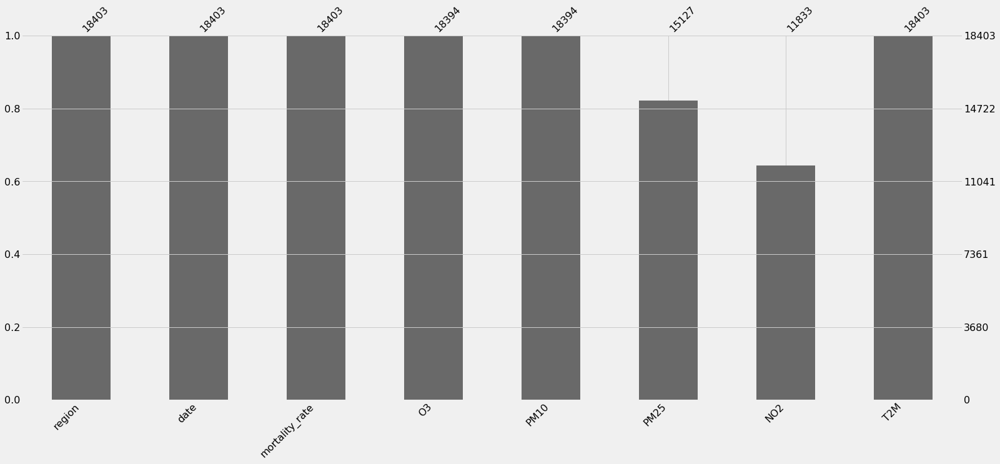

In [28]:
msno.bar(train)

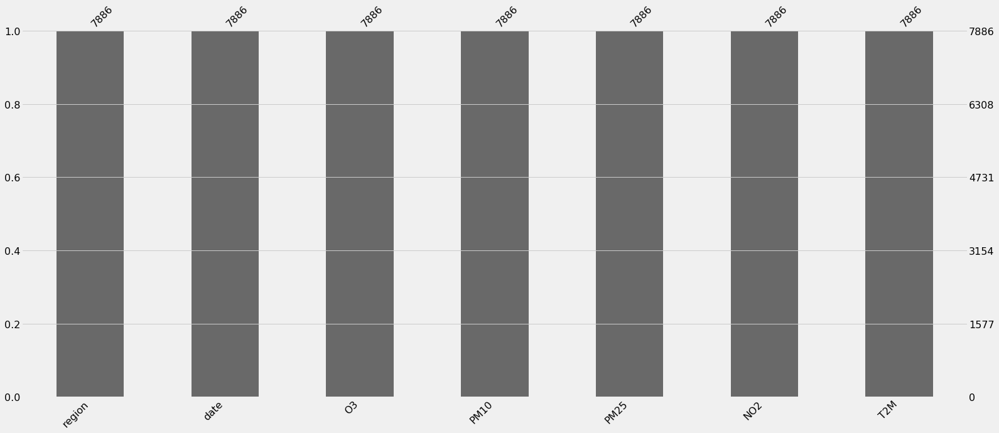

In [29]:
msno.bar(test)

# No missing values

AxesSubplot(0.08,0.07;0.784255x0.81)
AxesSubplot(0.08,0.07;0.784255x0.81)
AxesSubplot(0.08,0.07;0.784255x0.81)
AxesSubplot(0.08,0.07;0.784255x0.81)
AxesSubplot(0.08,0.07;0.784255x0.81)
AxesSubplot(0.08,0.07;0.784255x0.81)
AxesSubplot(0.08,0.07;0.784255x0.81)
AxesSubplot(0.08,0.07;0.784255x0.81)
AxesSubplot(0.08,0.07;0.784255x0.81)


15

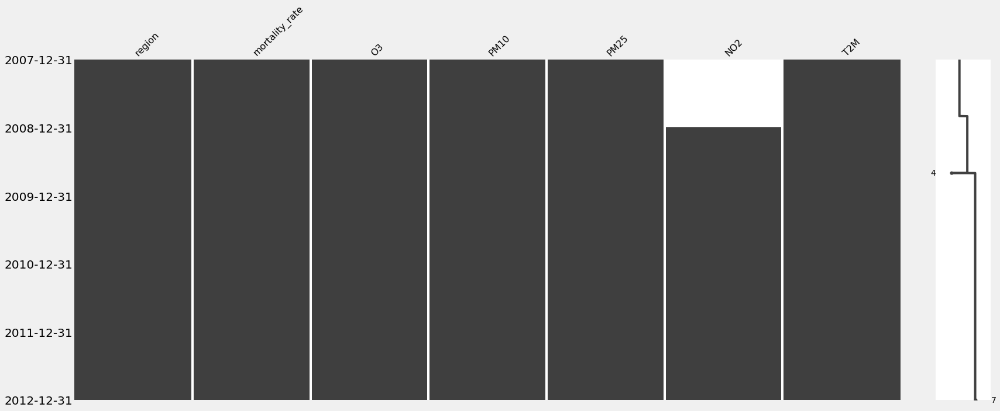

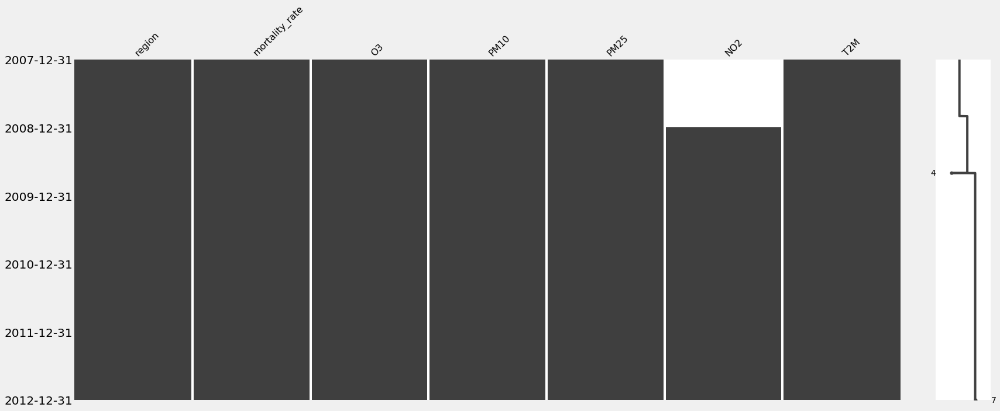

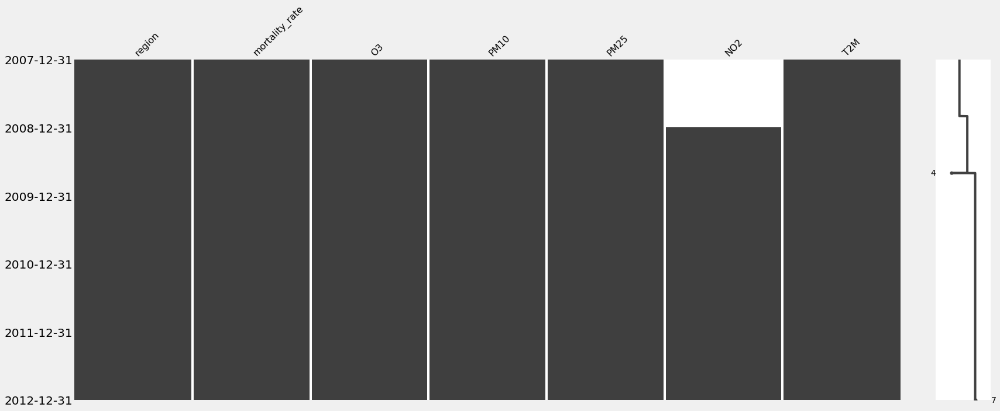

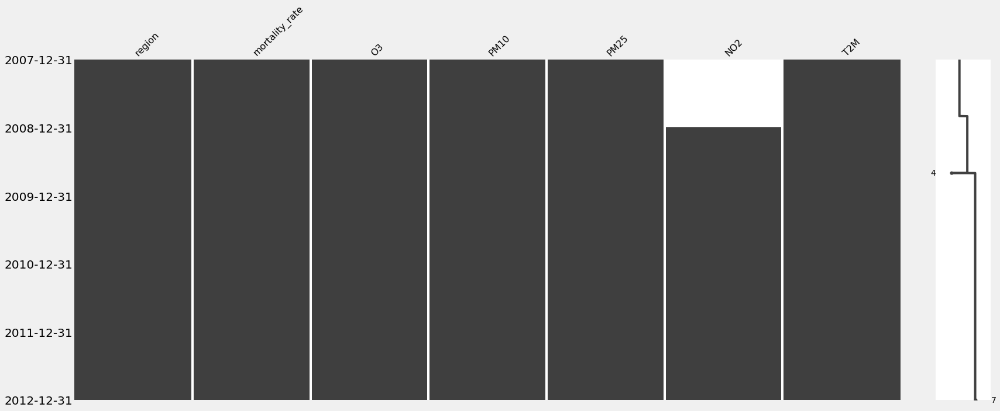

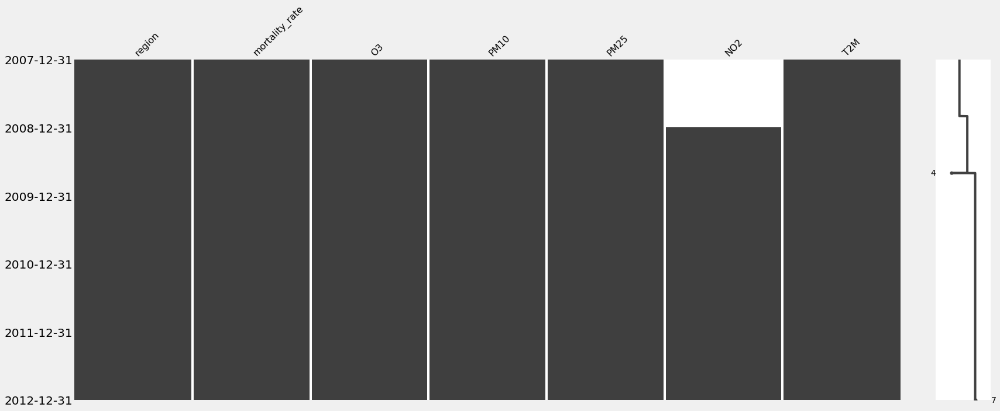

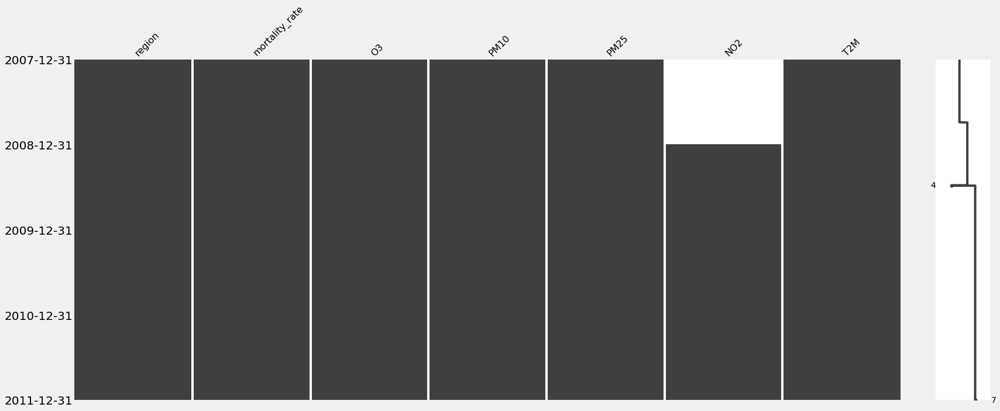

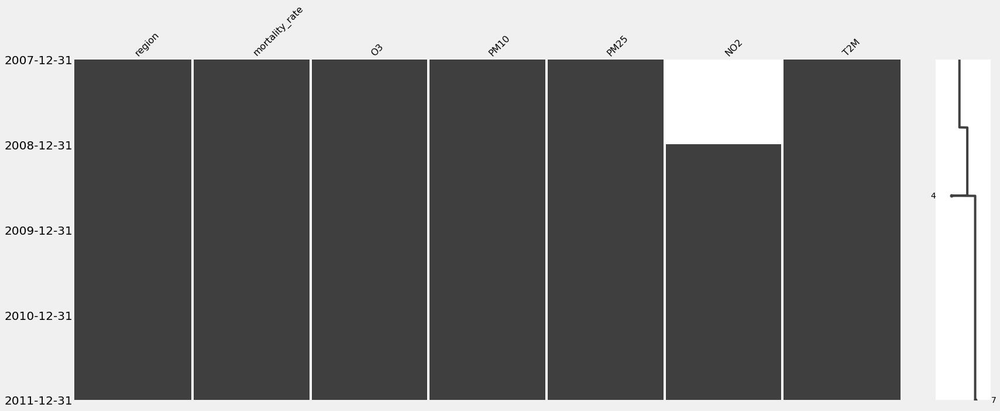

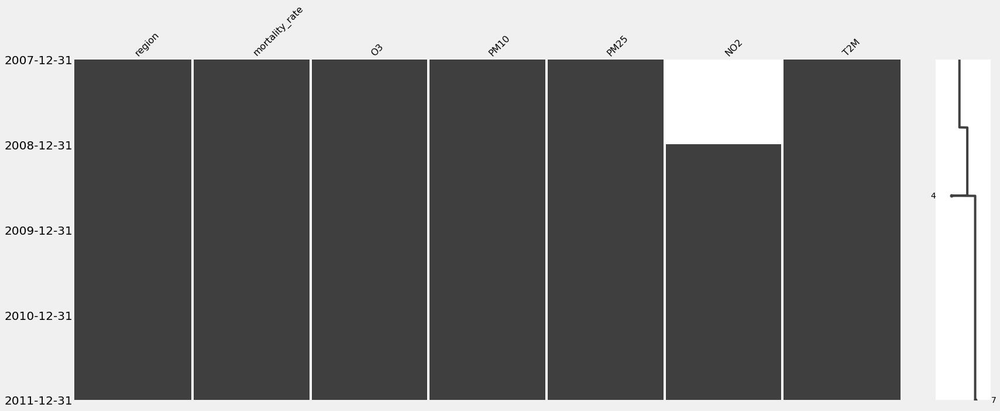

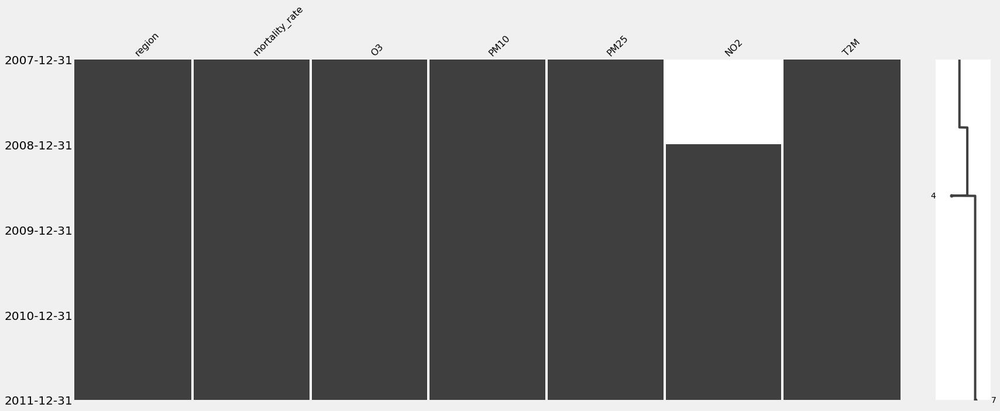

In [30]:
temp = train.set_index('date')

for r in train['region'].unique():
  t = temp[temp['region']==r]
  print(msno.matrix(t, freq = 'A'))

del temp, t
gc.collect()

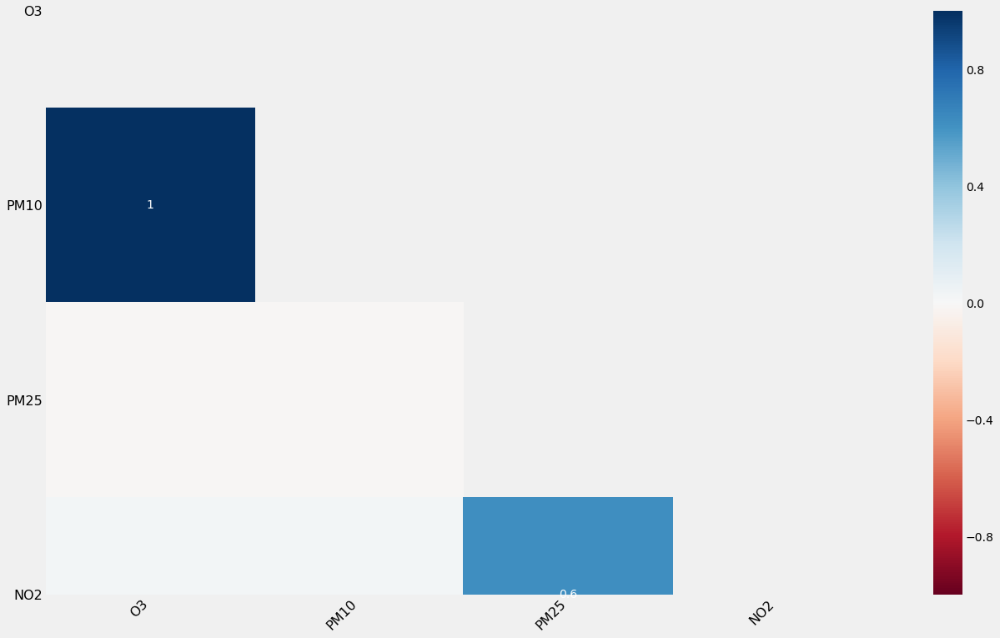

In [31]:
msno.heatmap(train)

# https://github.com/ResidentMario/missingno

# correlation heatmap measures nullity correlation: how strongly the presence or absence of one variable affects the presence of another
# Variables that are always full or always empty have no meaningful correlation, and so are silently removed from the visualization—in this case for instance the datetime and injury number columns, which are completely filled, are not included.

AxesSubplot(0.08,0.07;0.696x0.81)
AxesSubplot(0.08,0.07;0.696x0.81)
AxesSubplot(0.08,0.07;0.696x0.81)
AxesSubplot(0.08,0.07;0.696x0.81)
AxesSubplot(0.08,0.07;0.696x0.81)
AxesSubplot(0.08,0.07;0.696x0.81)
AxesSubplot(0.08,0.07;0.696x0.81)
AxesSubplot(0.08,0.07;0.696x0.81)
AxesSubplot(0.08,0.07;0.696x0.81)


38363

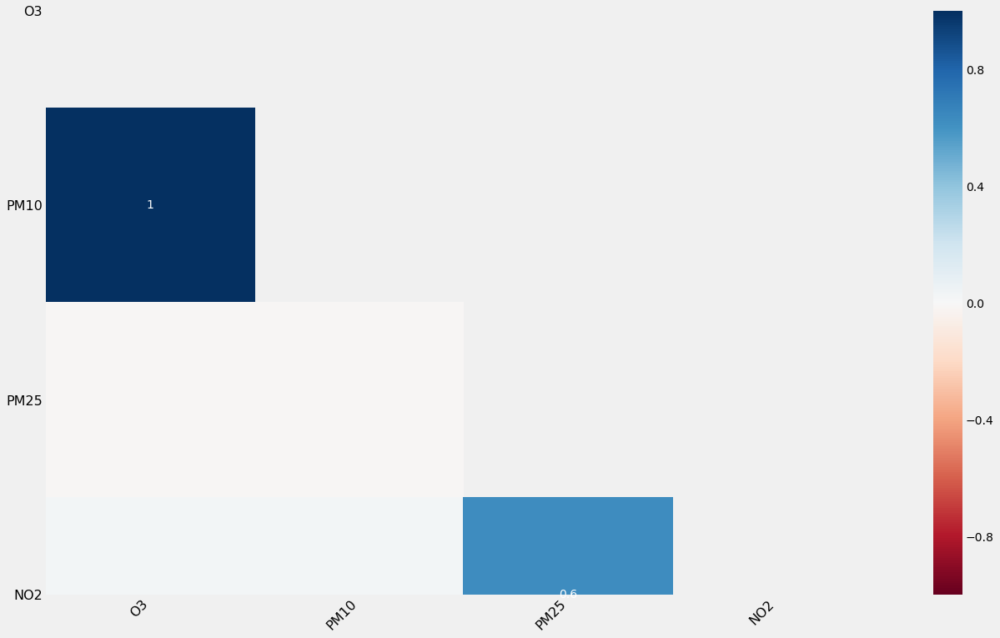

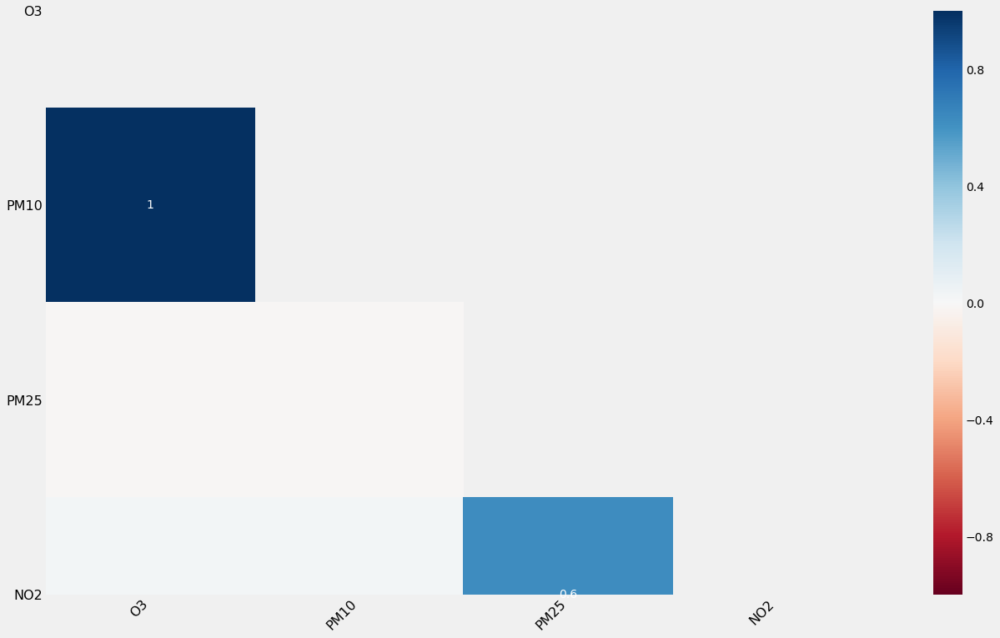

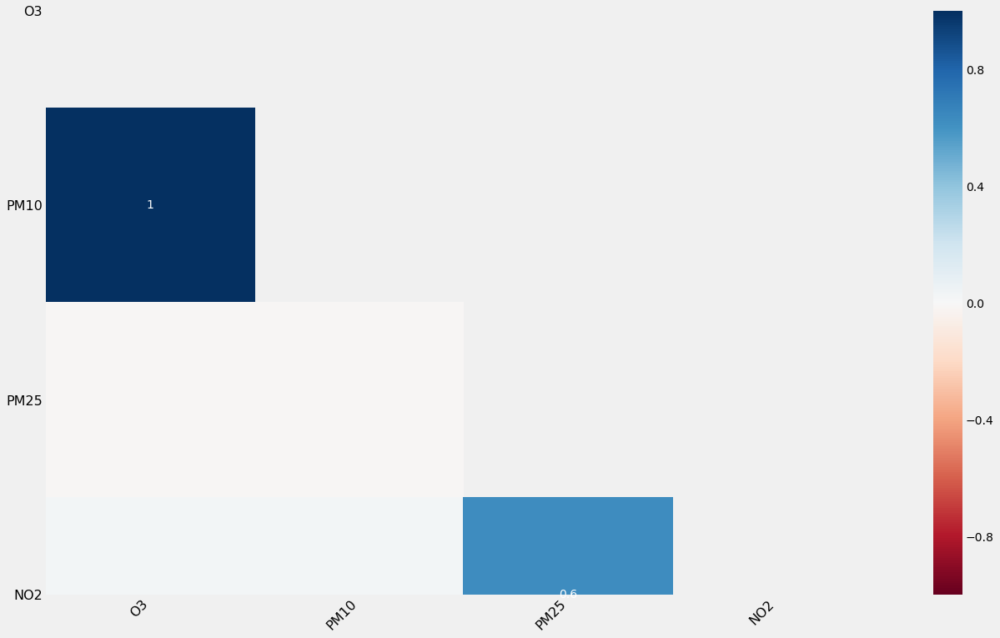

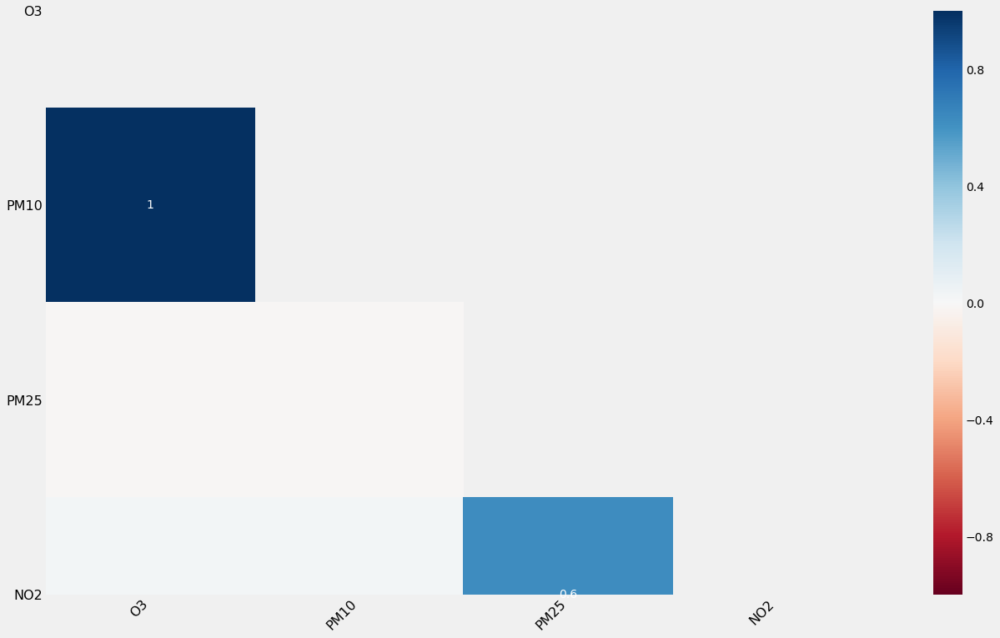

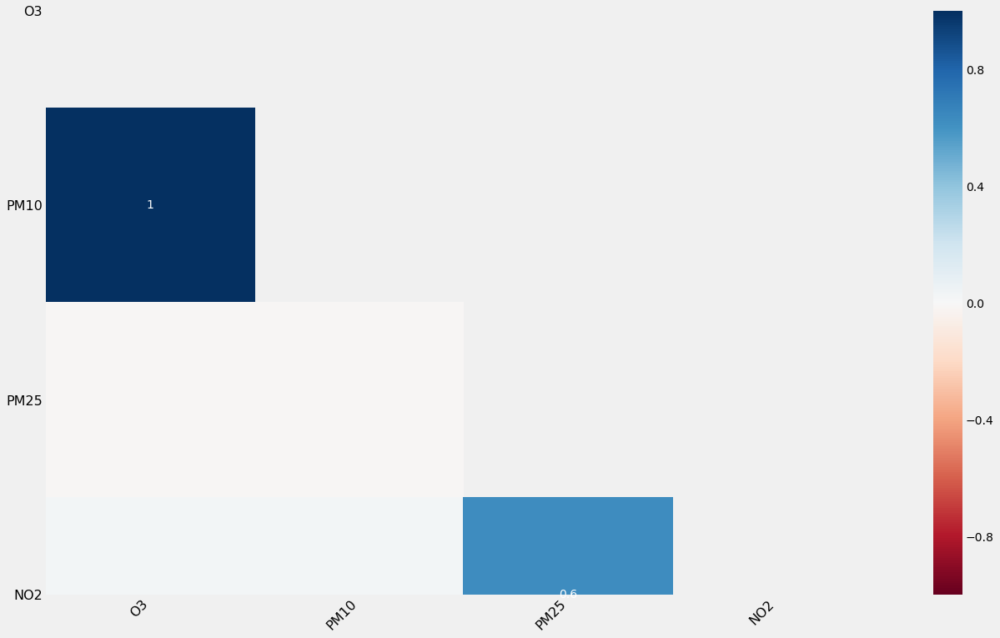

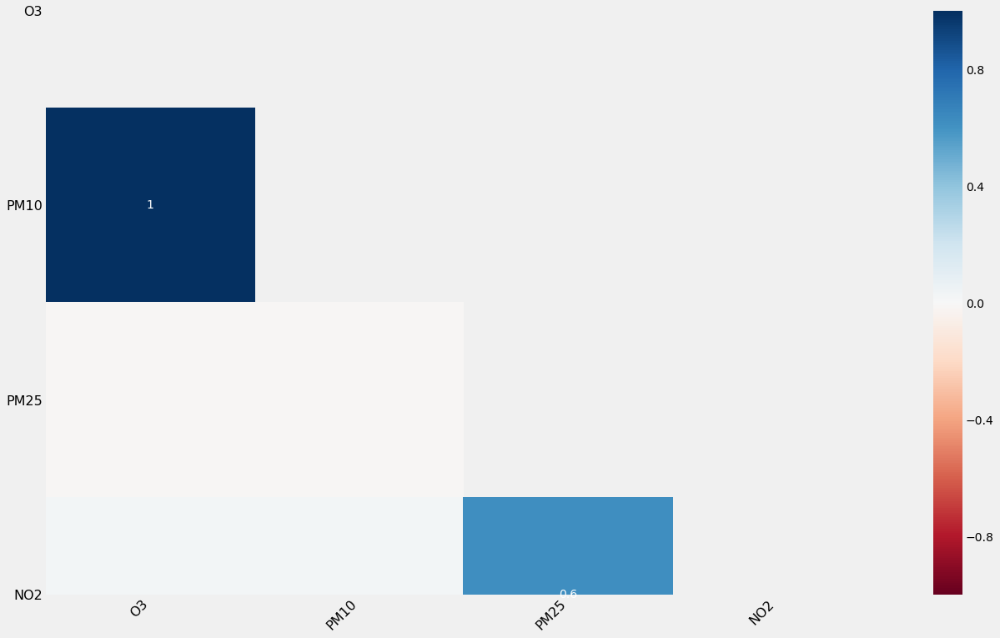

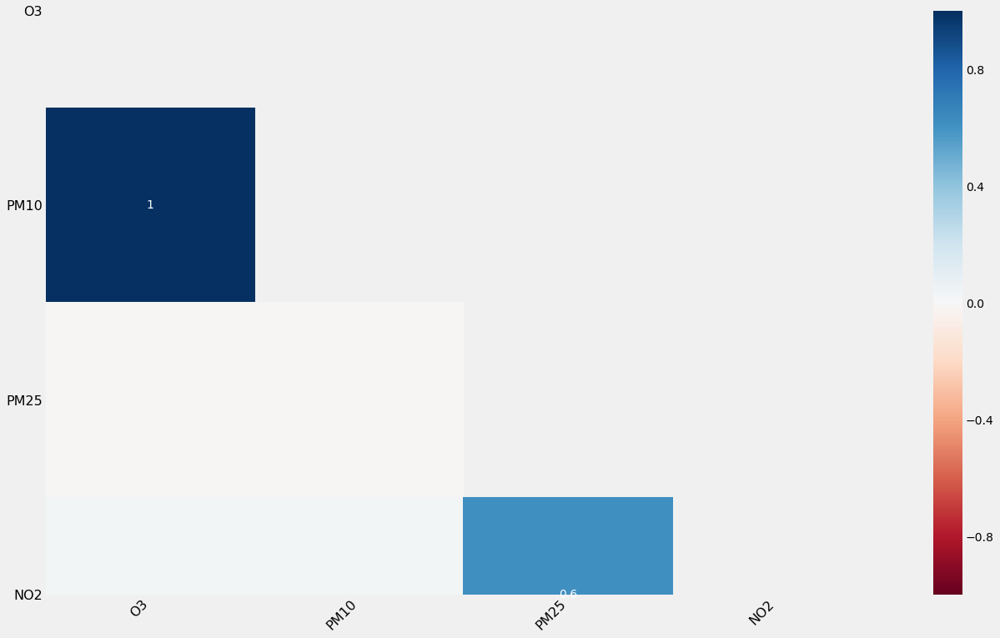

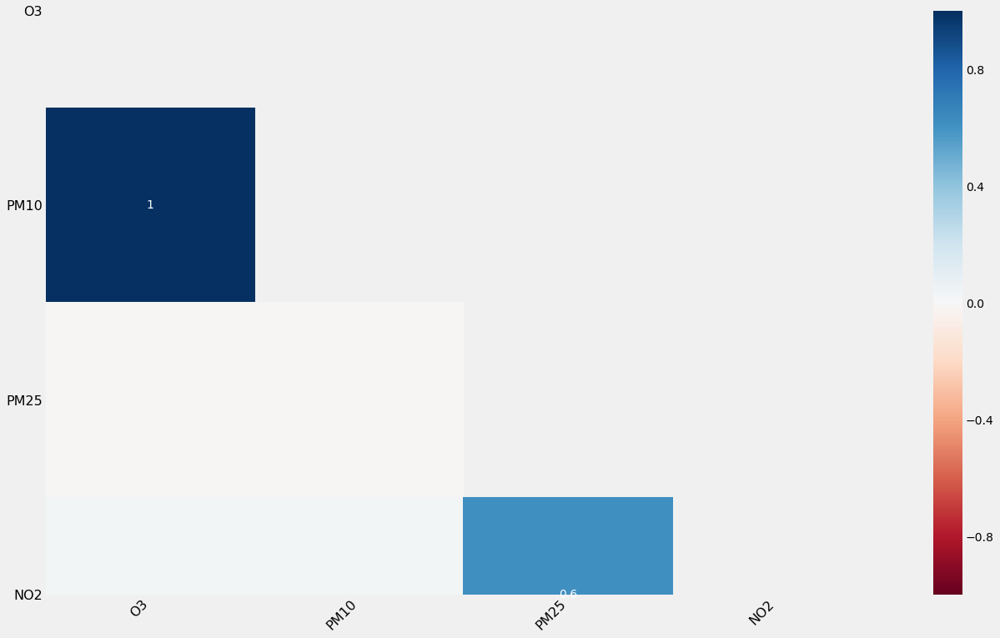

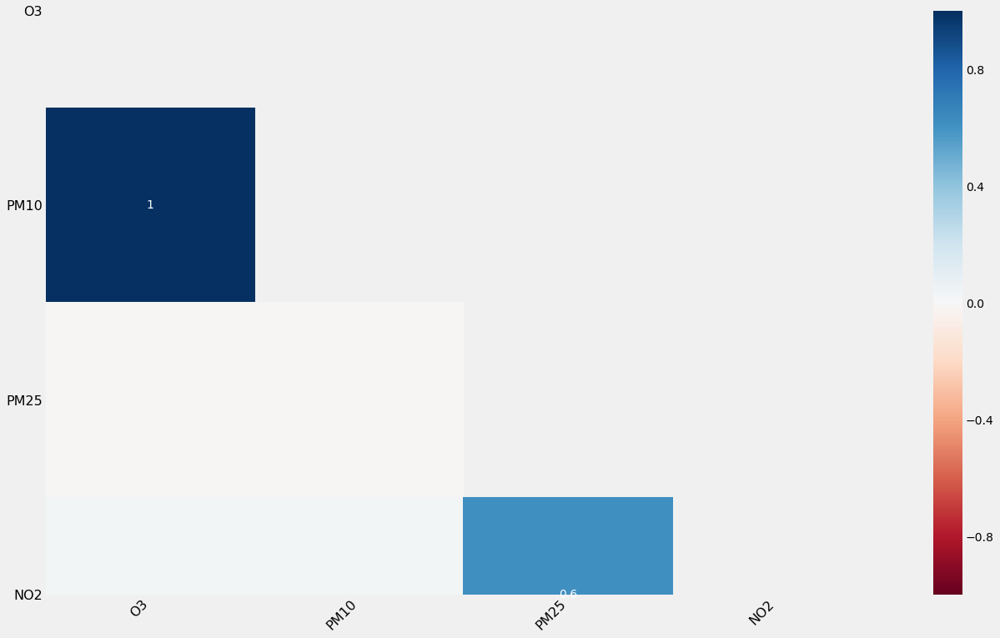

In [32]:
for r in train['region'].unique():
  t = train[train['region']==r]
  print(msno.heatmap(t))

del t
gc.collect()

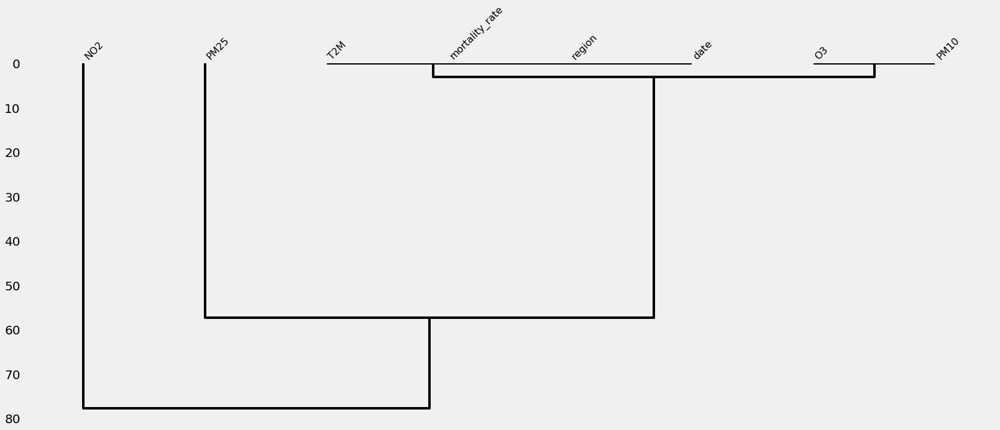

In [33]:
msno.dendrogram(train)

AxesSubplot(0.08,0.07;0.87x0.81)
AxesSubplot(0.08,0.07;0.87x0.81)
AxesSubplot(0.08,0.07;0.87x0.81)
AxesSubplot(0.08,0.07;0.87x0.81)
AxesSubplot(0.08,0.07;0.87x0.81)
AxesSubplot(0.08,0.07;0.87x0.81)
AxesSubplot(0.08,0.07;0.87x0.81)
AxesSubplot(0.08,0.07;0.87x0.81)
AxesSubplot(0.08,0.07;0.87x0.81)


35935

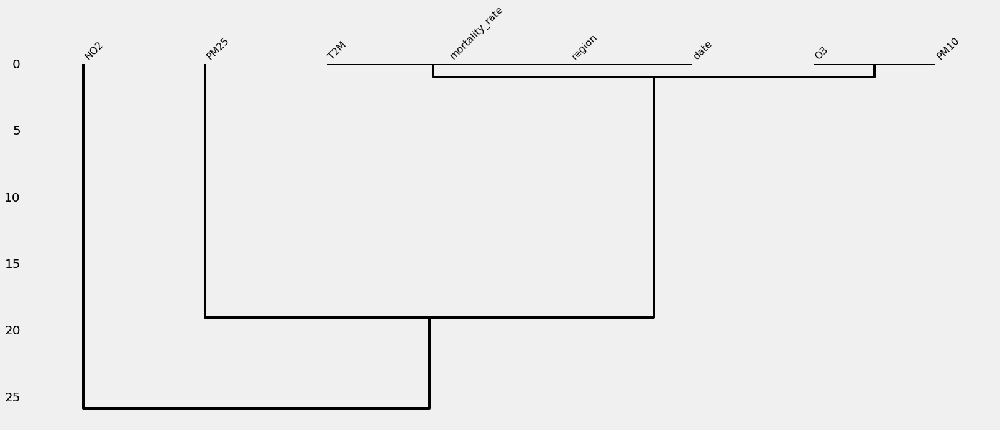

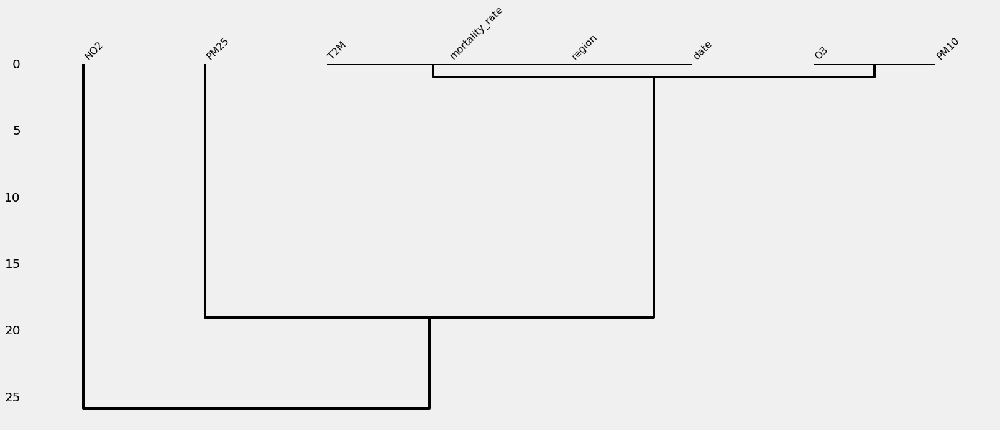

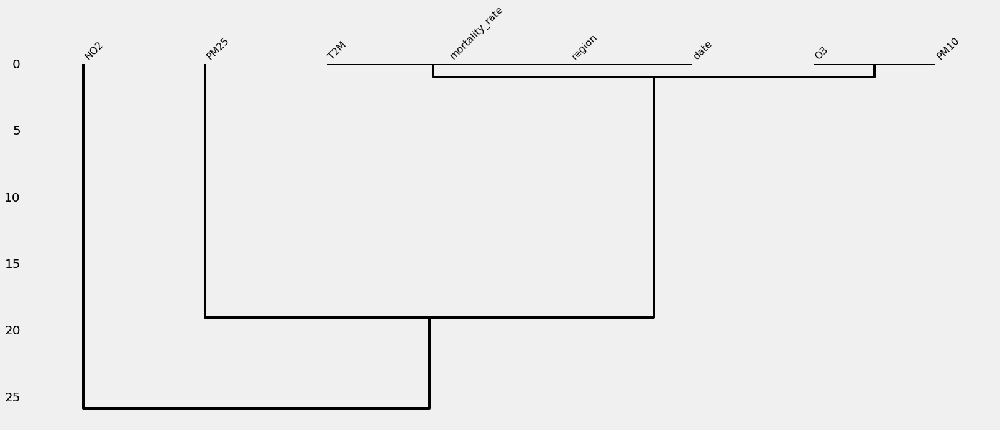

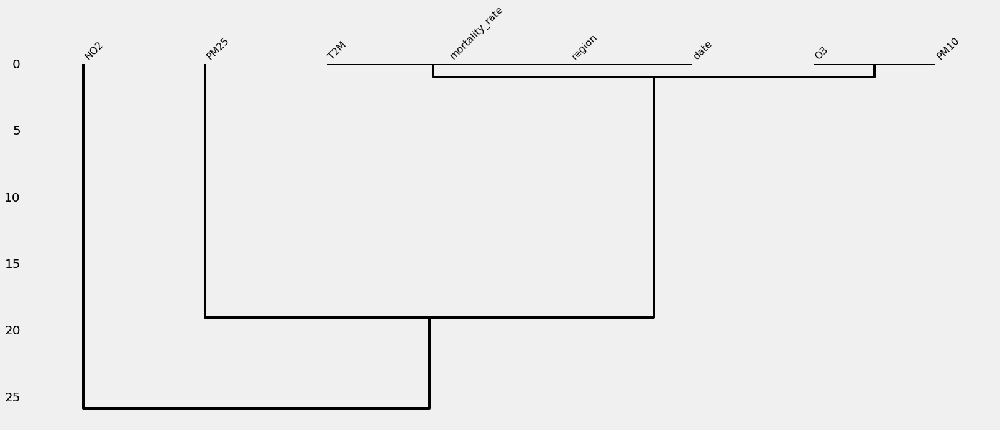

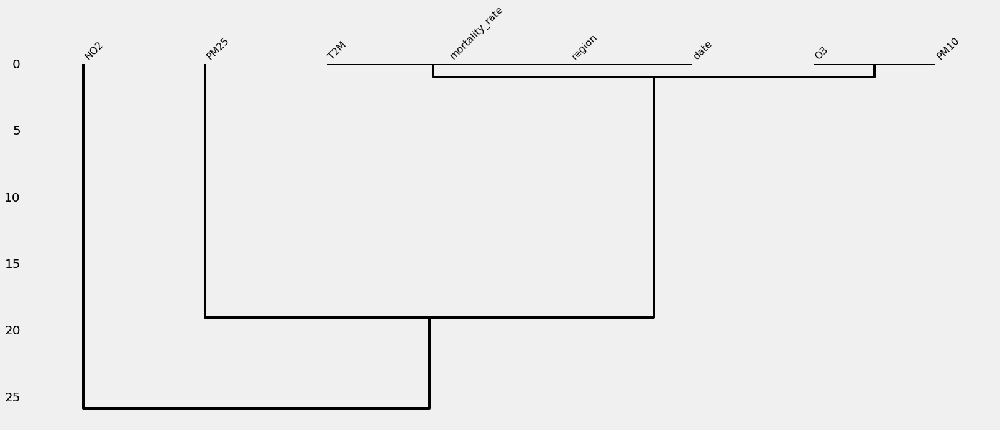

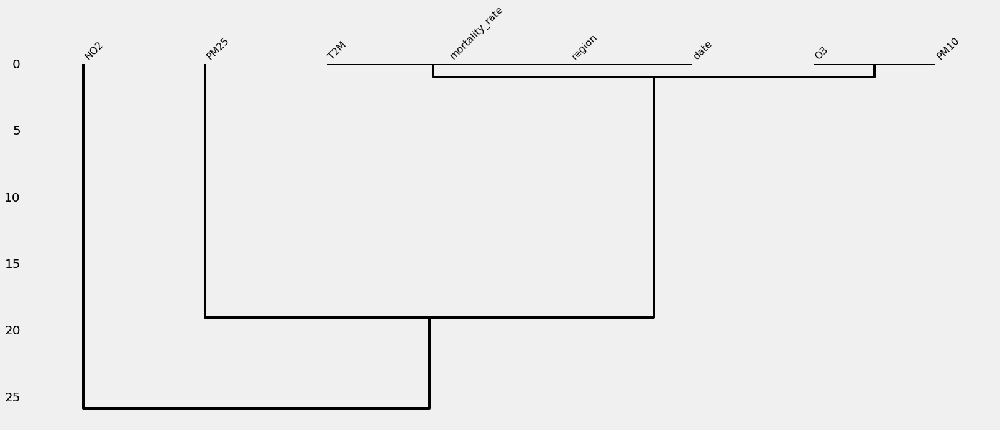

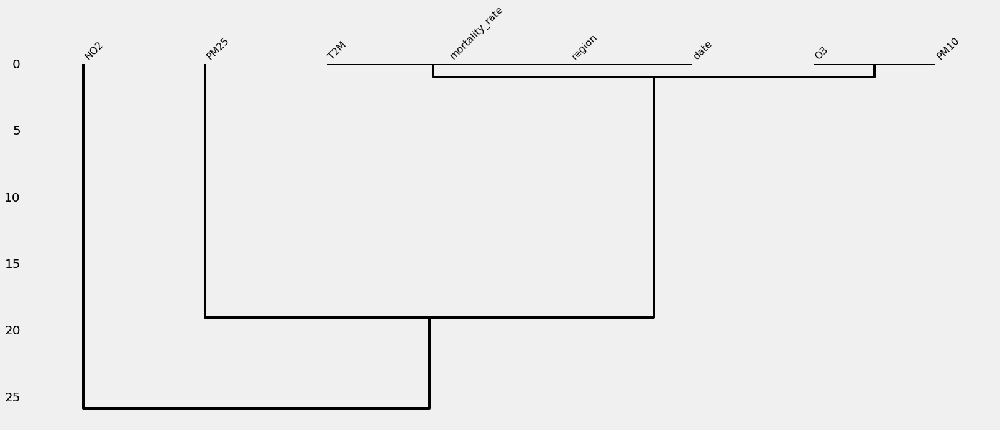

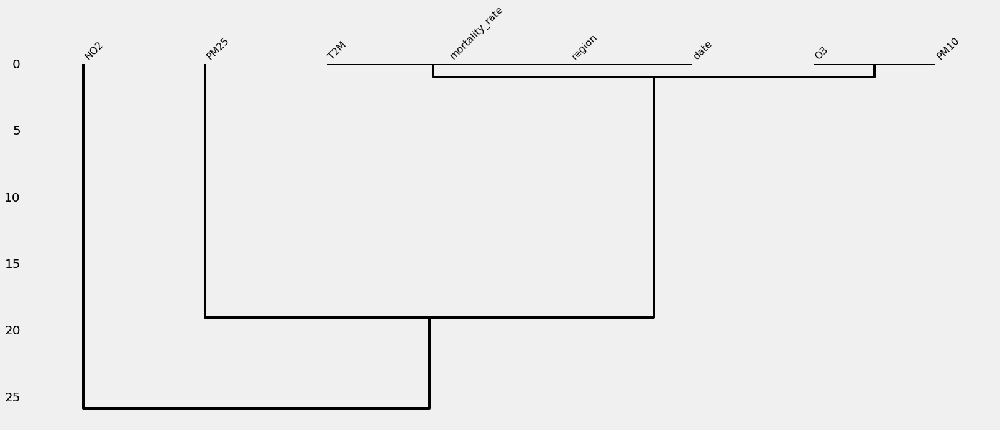

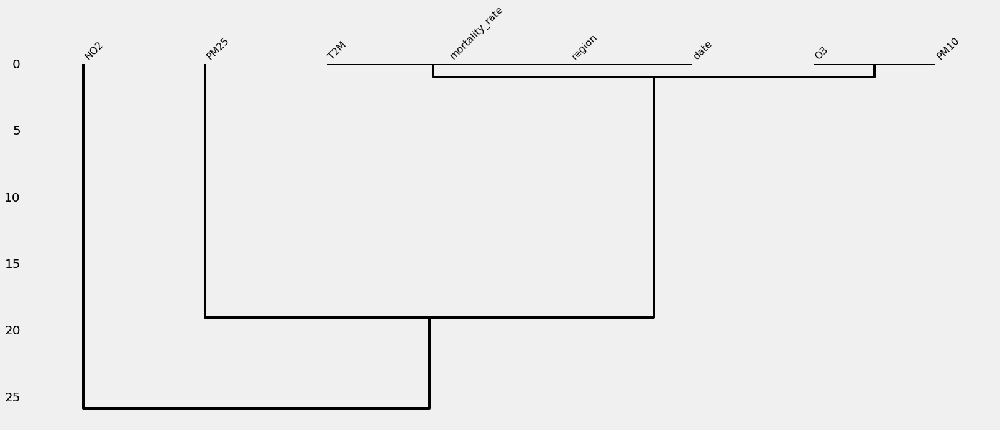

In [34]:
for r in train['region'].unique():
  t = train[train['region']==r]
  print(msno.dendrogram(t))

del t
gc.collect()

**_Missing values present in 4 columns, O3 ,PM10, PM25, NO2_**

## Merging Region names with the rest of the data

In [35]:
train1 = train.merge(region, left_on='region', right_on='Code')
#train1.drop(columns = ['region'],inplace=True)
test1 = test.merge(region, left_on='region', right_on='Code')
#test1.drop(columns = ['region'],inplace=True)

## univariate analysis ##

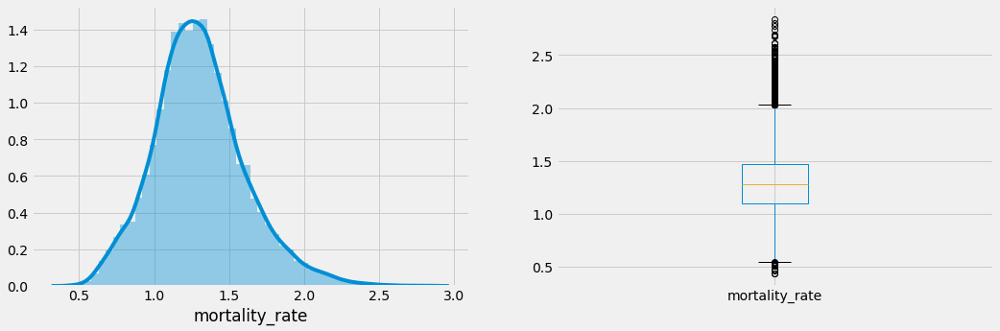

In [36]:
plotuni('mortality_rate',train)

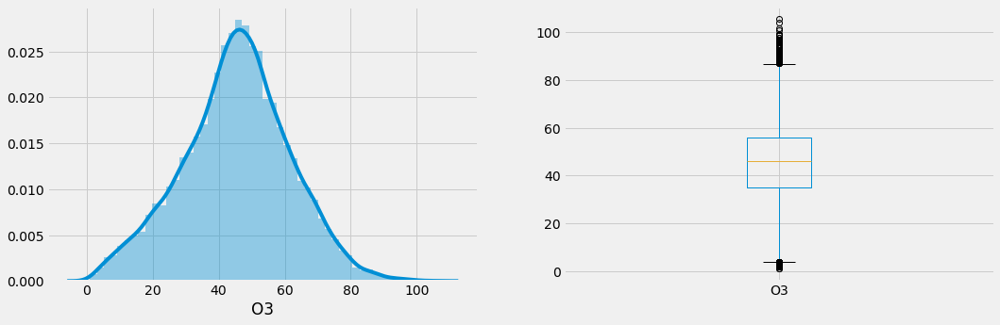

In [37]:
plotuni('O3',train)

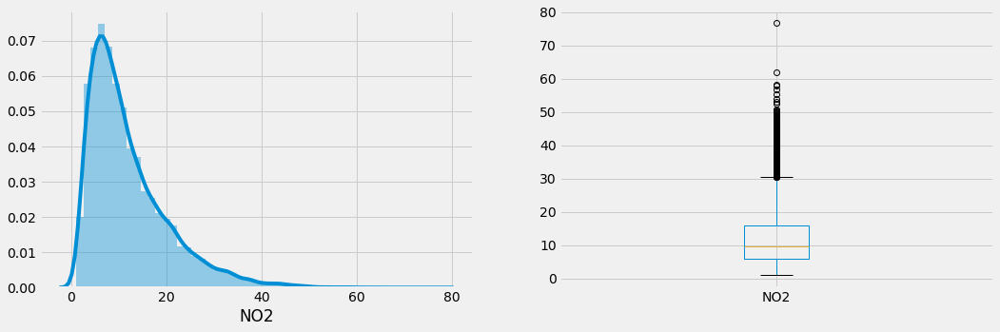

In [38]:
plotuni('NO2',train)

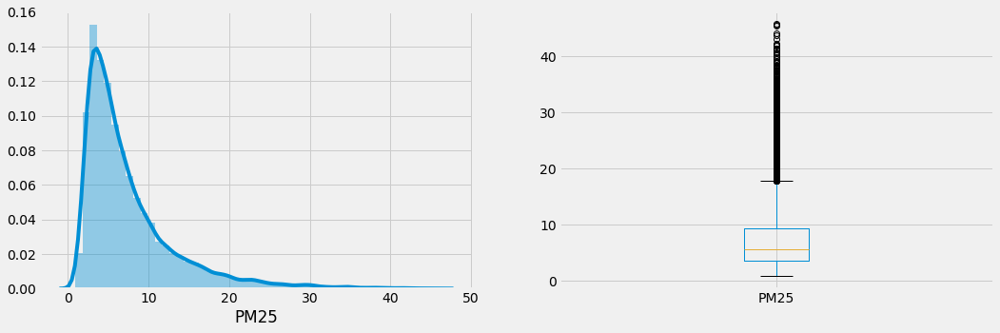

In [40]:
plotuni('PM25',train)

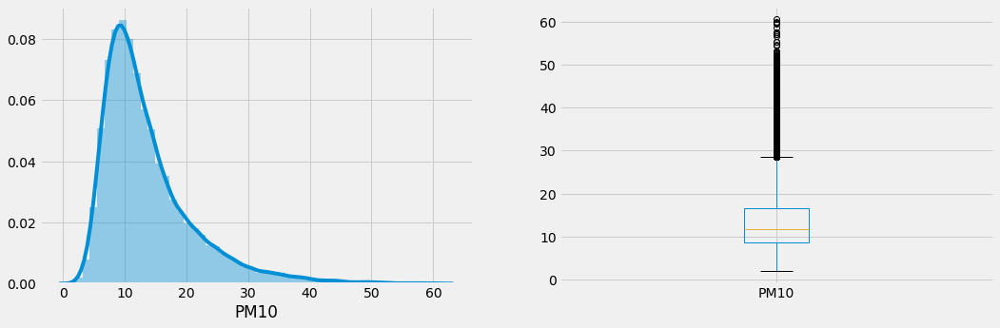

In [42]:
plotuni('PM10',train)

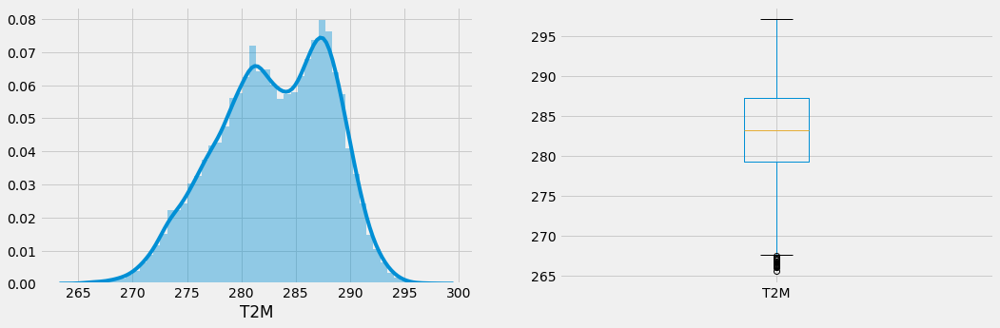

In [44]:
plotuni('T2M',train)

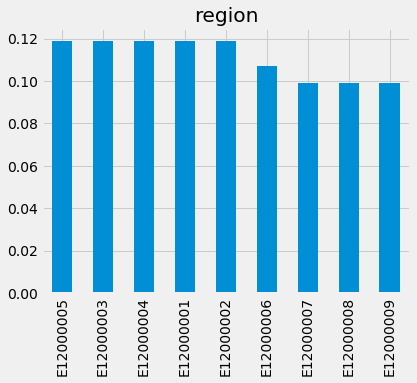

In [45]:
# Visualizing categorical features
plt.subplot(231)
train['region'].value_counts(normalize=True).plot.bar(figsize=(20,10), title= 'region')

Mortality Rate plot for region : E12000001


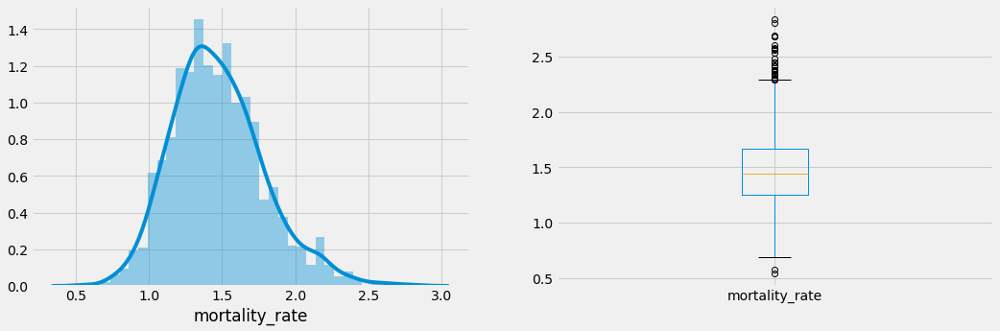

None
Mortality Rate plot for region : E12000002


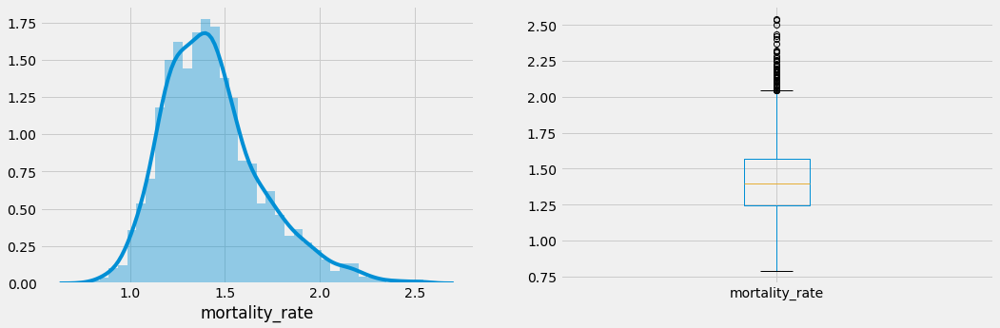

None
Mortality Rate plot for region : E12000003


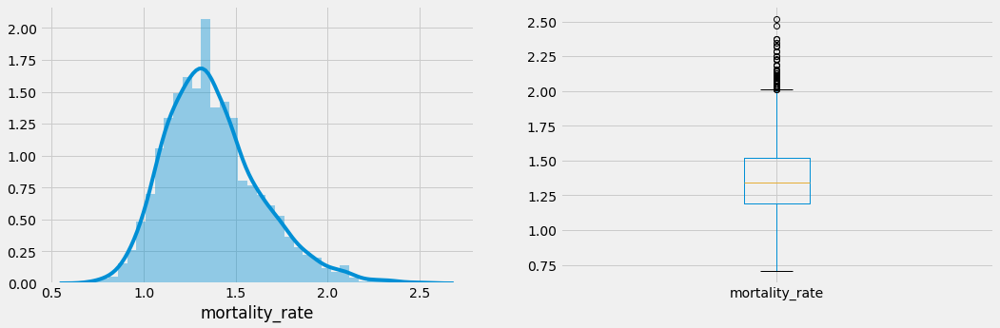

None
Mortality Rate plot for region : E12000004


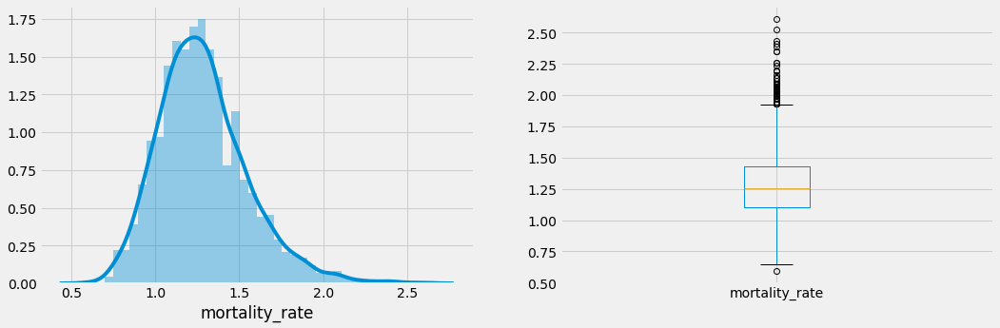

None
Mortality Rate plot for region : E12000005


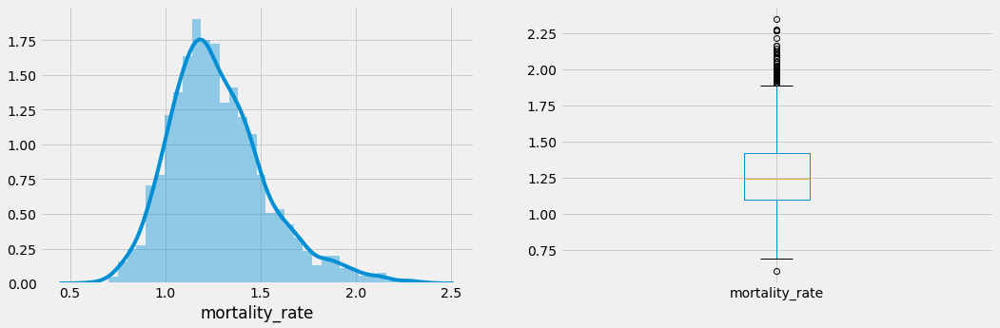

None
Mortality Rate plot for region : E12000006


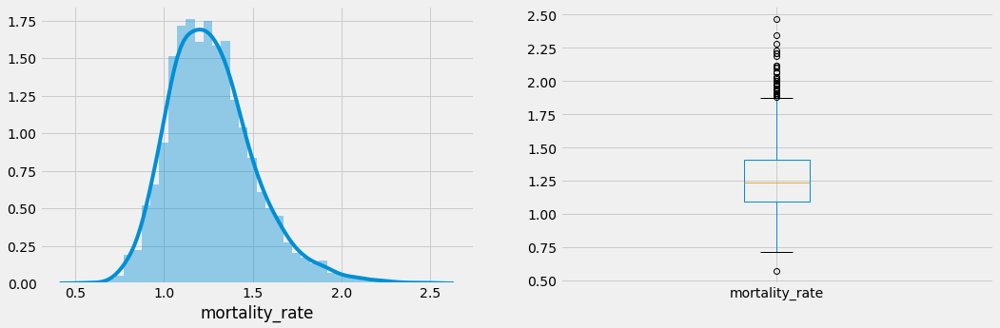

None
Mortality Rate plot for region : E12000007


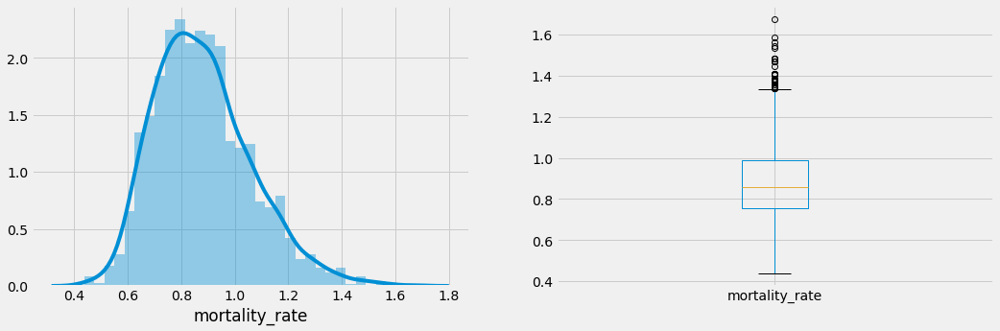

None
Mortality Rate plot for region : E12000008


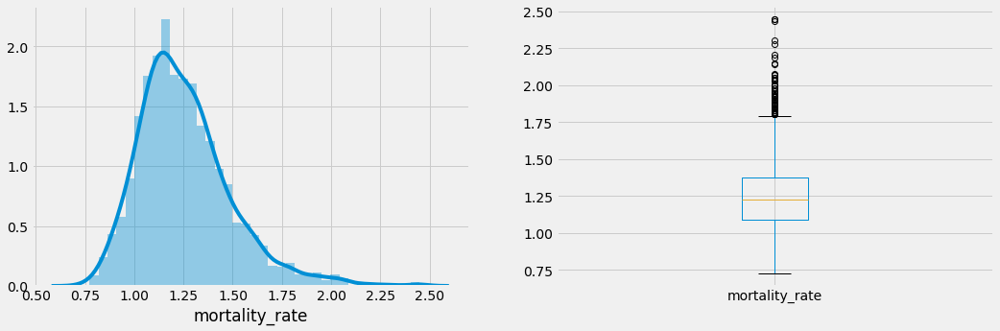

None
Mortality Rate plot for region : E12000009


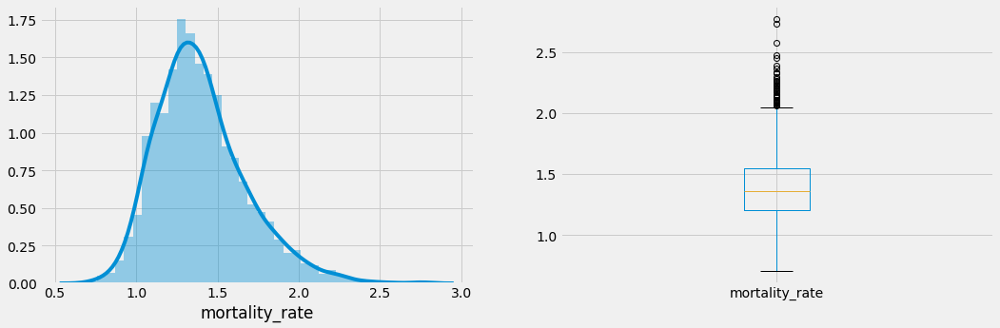

None


In [150]:
for r in train['region'].unique():
    t = train[train['region']==r]
    print("Mortality Rate plot for region :",r)
    print(plotuni('mortality_rate',t))
    

NO2 plot for region : E12000001


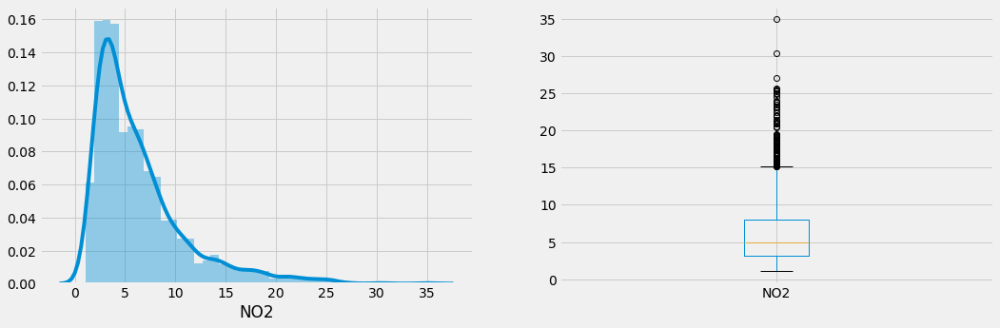

None
NO2 plot for region : E12000002


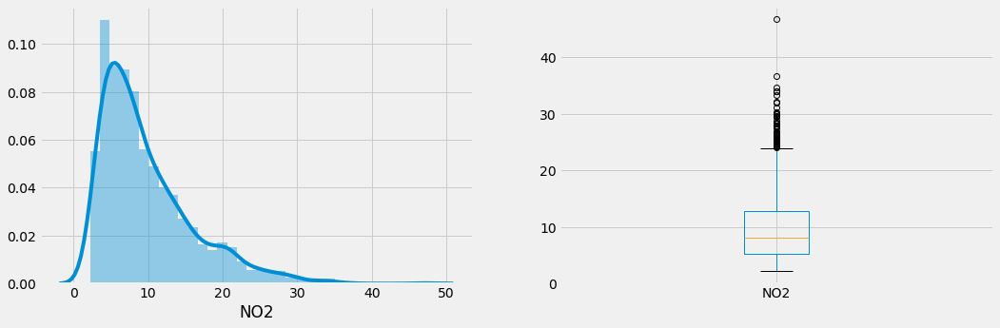

None
NO2 plot for region : E12000003


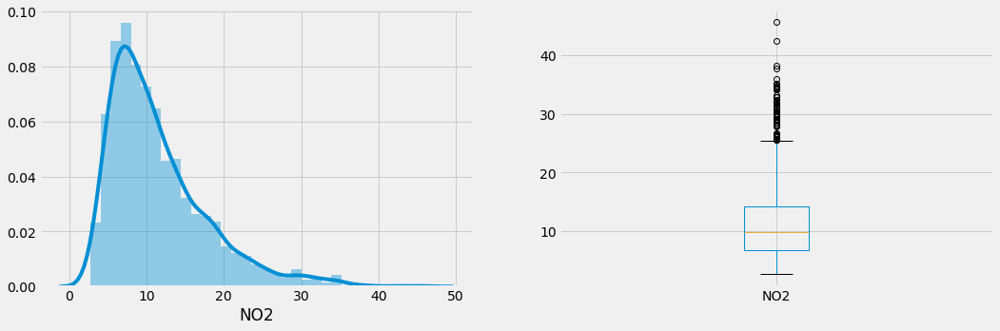

None
NO2 plot for region : E12000004


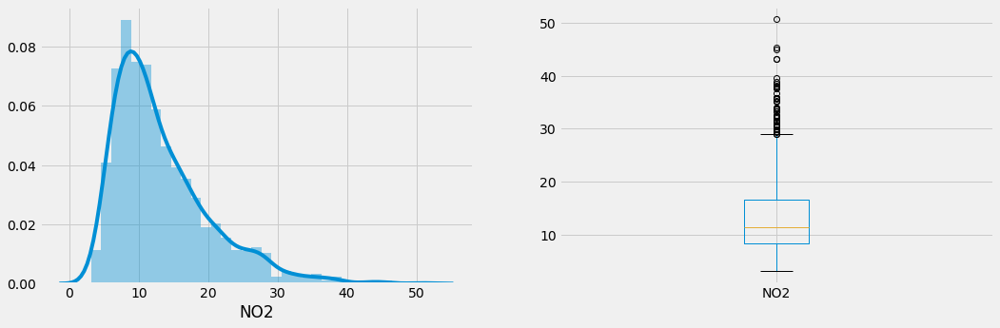

None
NO2 plot for region : E12000005


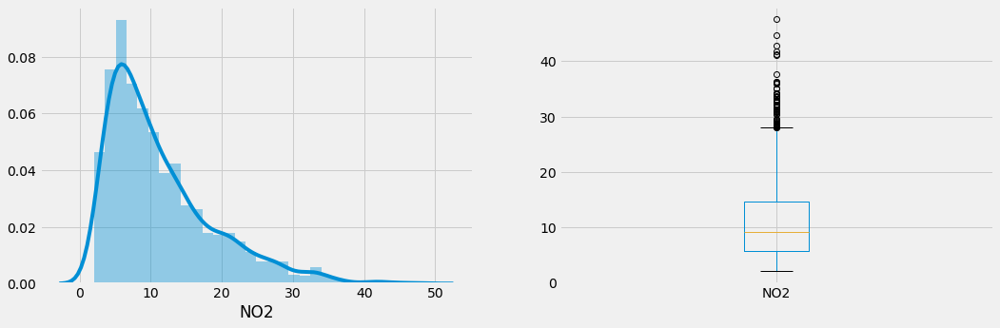

None
NO2 plot for region : E12000006


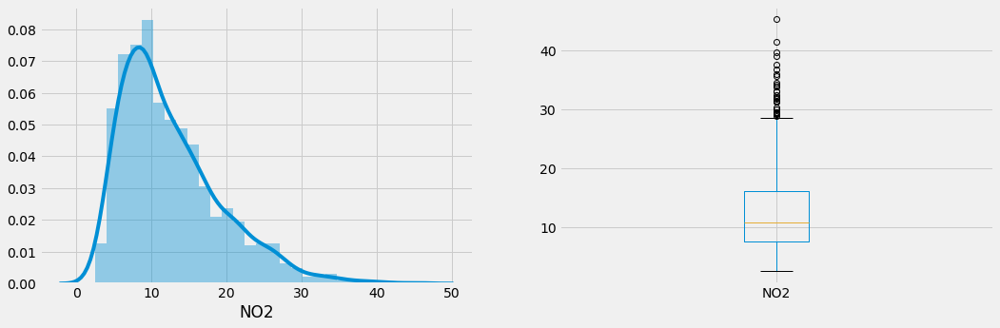

None
NO2 plot for region : E12000007


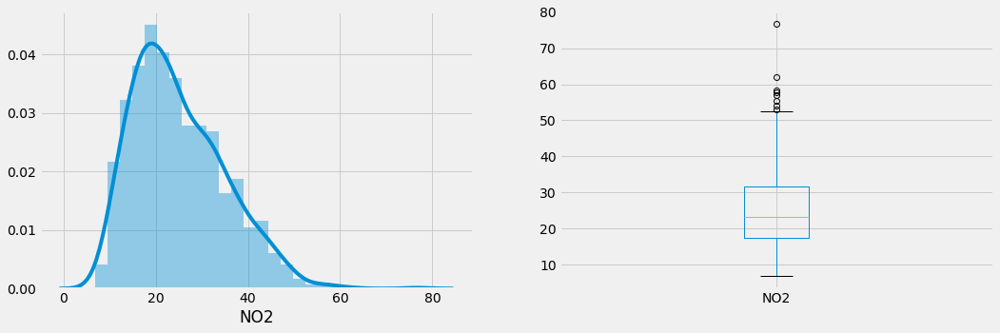

None
NO2 plot for region : E12000008


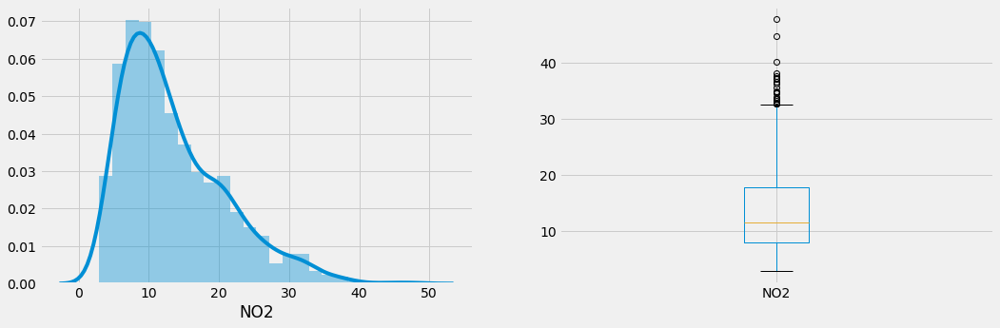

None
NO2 plot for region : E12000009


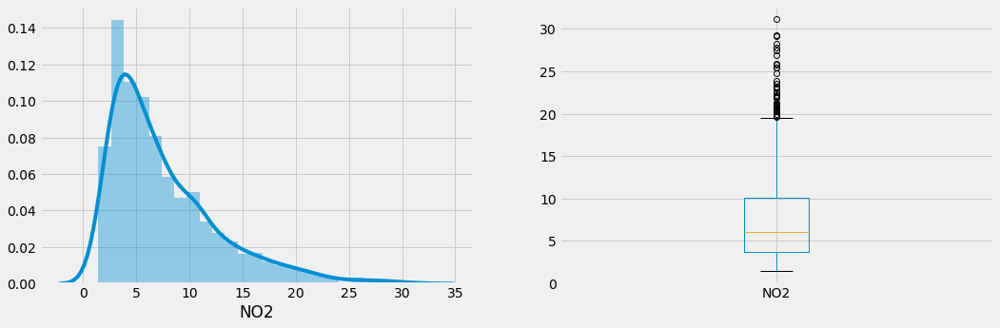

None


In [149]:
for r in train['region'].unique():
    t = train[train['region']==r]
    print("NO2 plot for region :",r)
    print(plotuni('NO2',t))
    

PM25 plot for region : E12000001


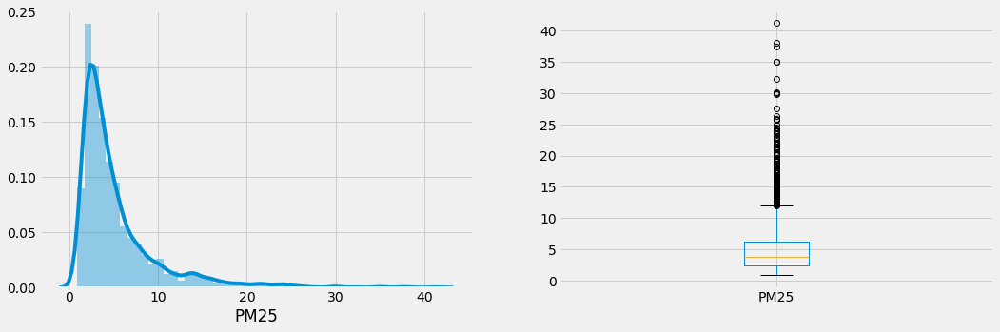

None
PM25 plot for region : E12000002


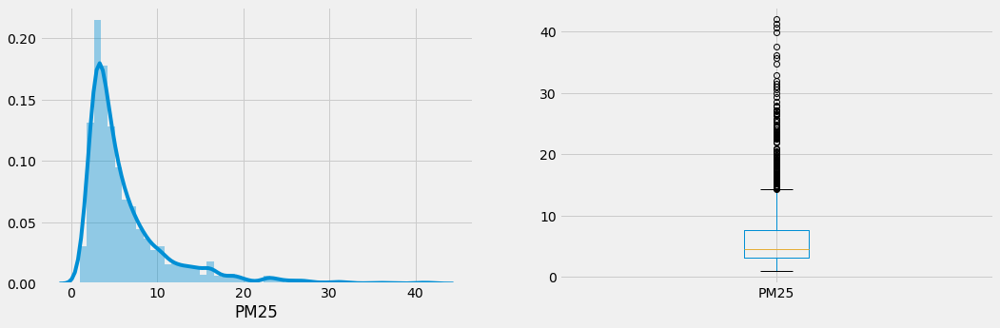

None
PM25 plot for region : E12000003


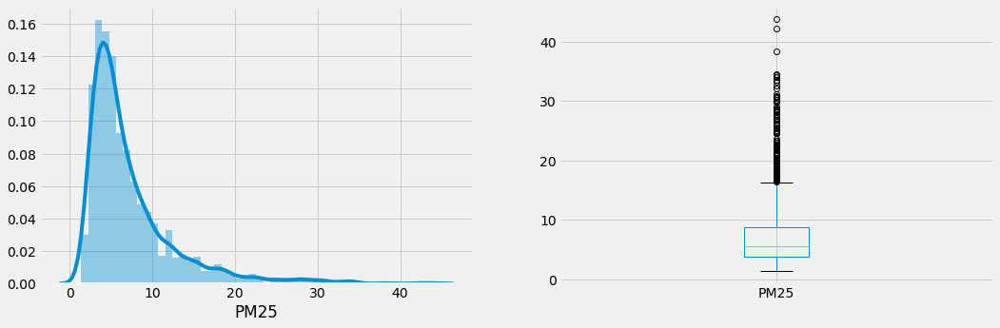

None
PM25 plot for region : E12000004


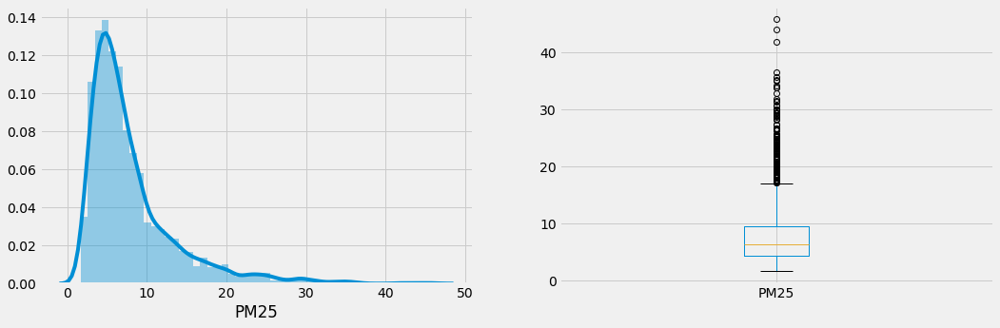

None
PM25 plot for region : E12000005


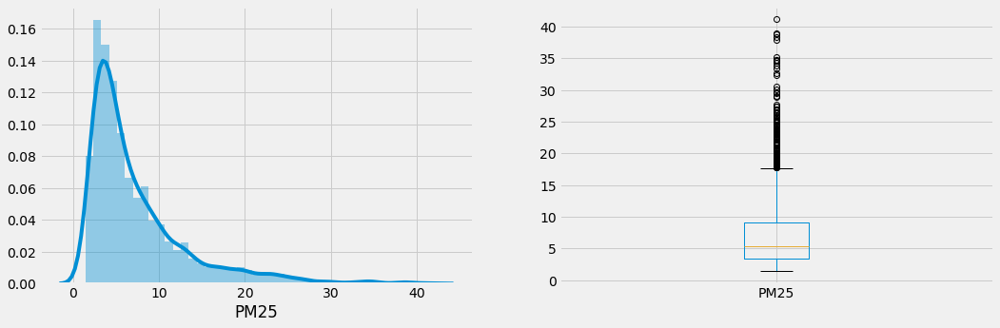

None
PM25 plot for region : E12000006


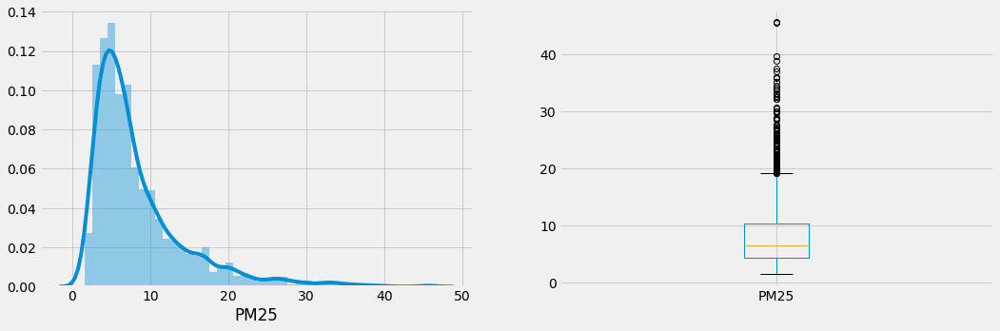

None
PM25 plot for region : E12000007


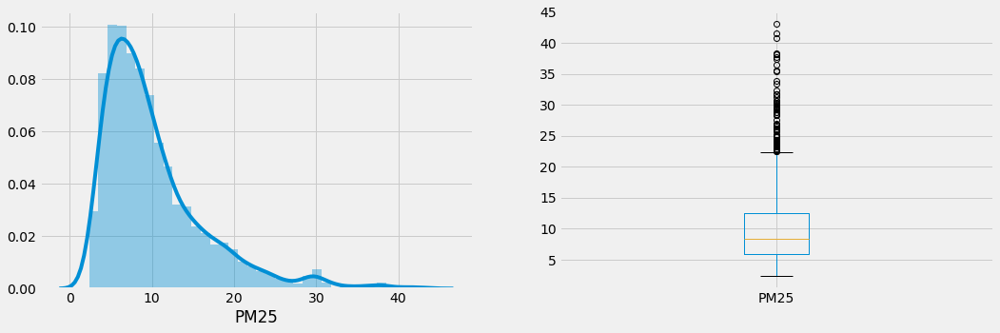

None
PM25 plot for region : E12000008


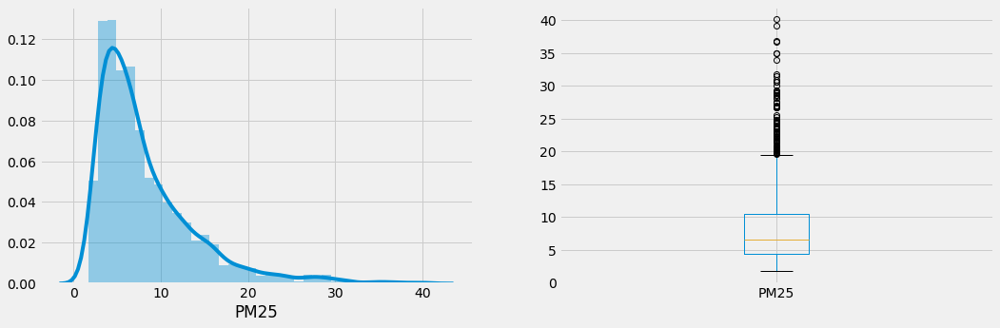

None
PM25 plot for region : E12000009


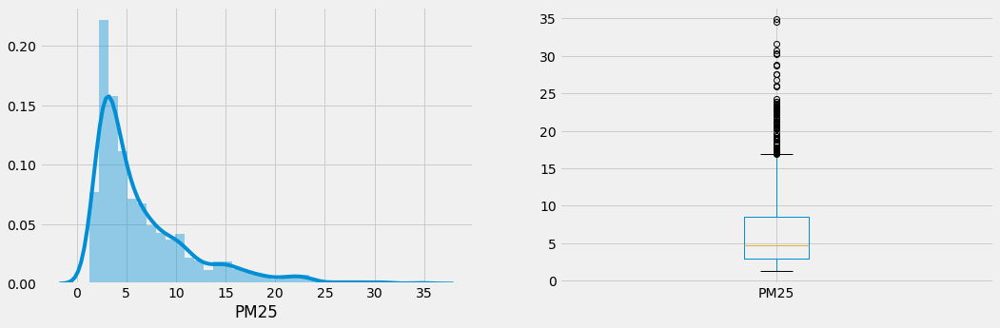

None


In [148]:
for r in train['region'].unique():
    t = train[train['region']==r]
    print("PM25 plot for region :",r)
    print(plotuni('PM25',t))
    

PM10 plot for region : E12000001


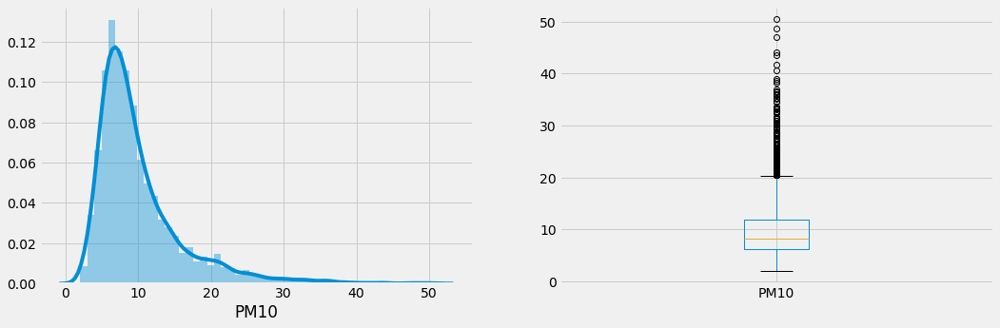

None
PM10 plot for region : E12000002


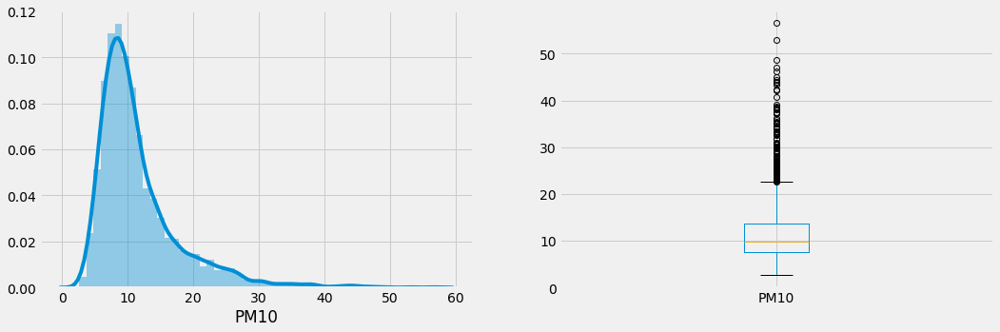

None
PM10 plot for region : E12000003


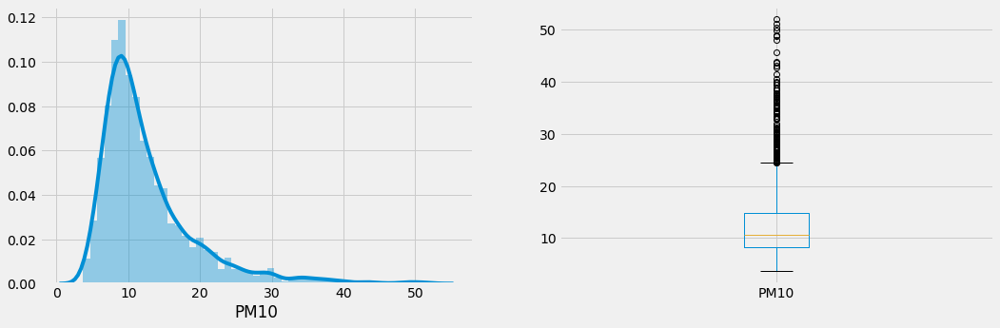

None
PM10 plot for region : E12000004


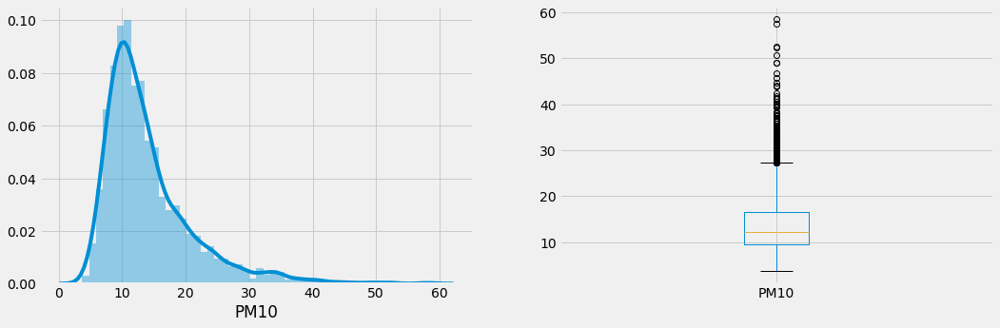

None
PM10 plot for region : E12000005


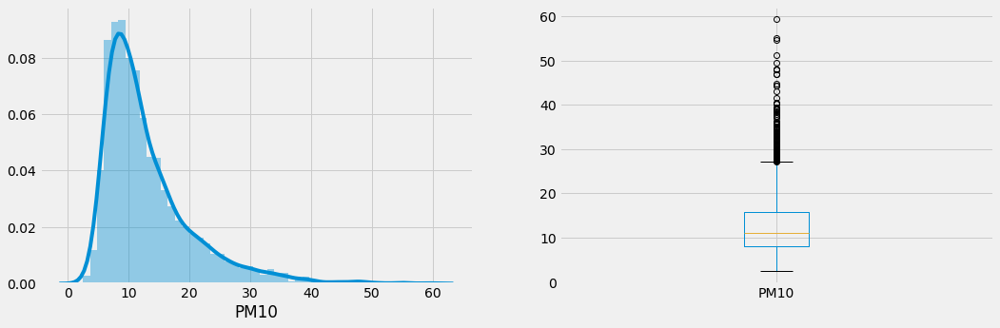

None
PM10 plot for region : E12000006


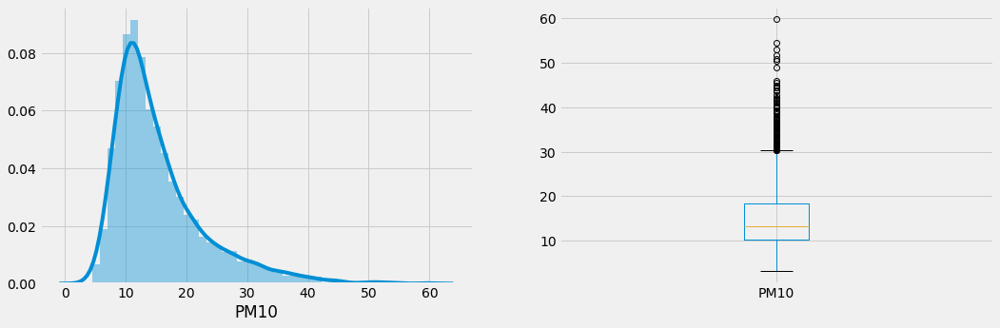

None
PM10 plot for region : E12000007


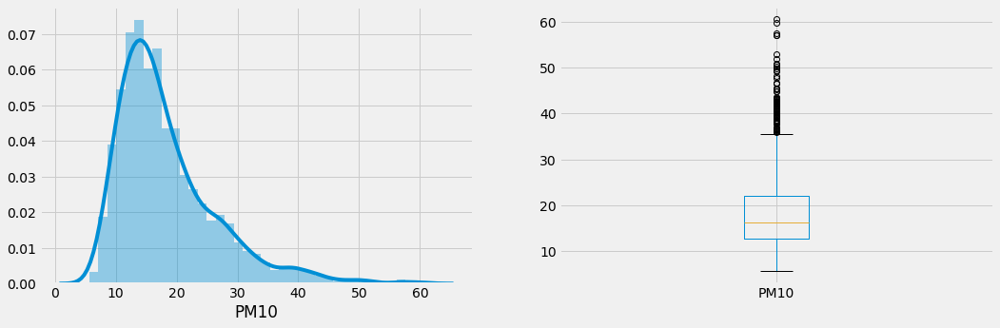

None
PM10 plot for region : E12000008


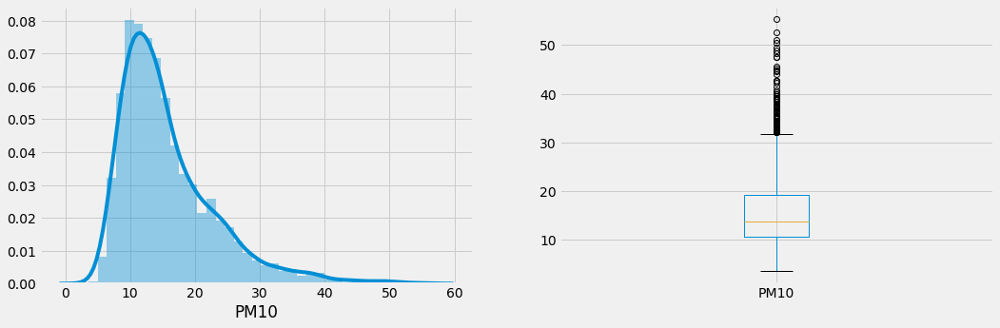

None
PM10 plot for region : E12000009


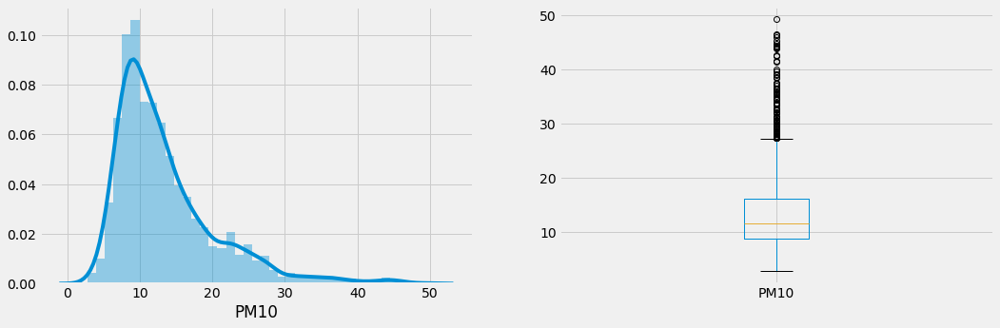

None


In [147]:
for r in train['region'].unique():
    t = train[train['region']==r]
    print("PM10 plot for region :",r)
    print(plotuni('PM10',t))
    

T2M plot for region : E12000001


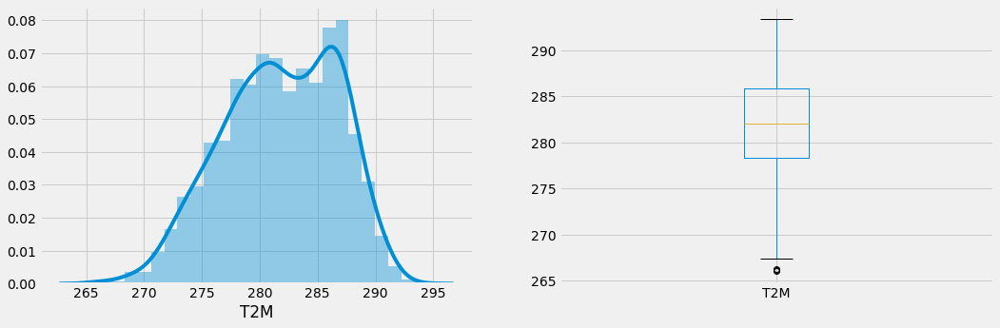

None
T2M plot for region : E12000002


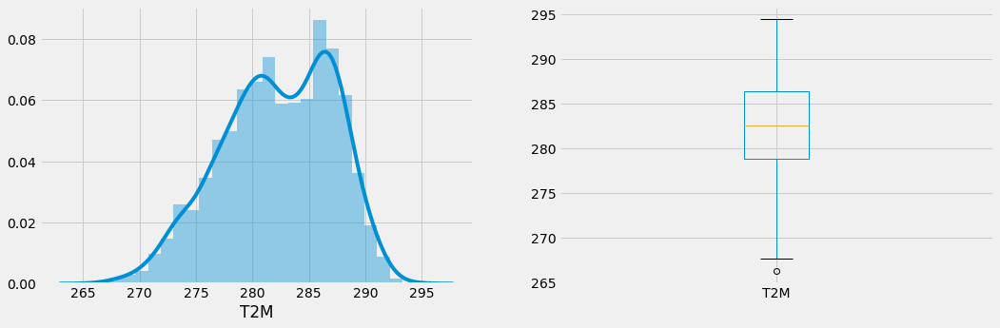

None
T2M plot for region : E12000003


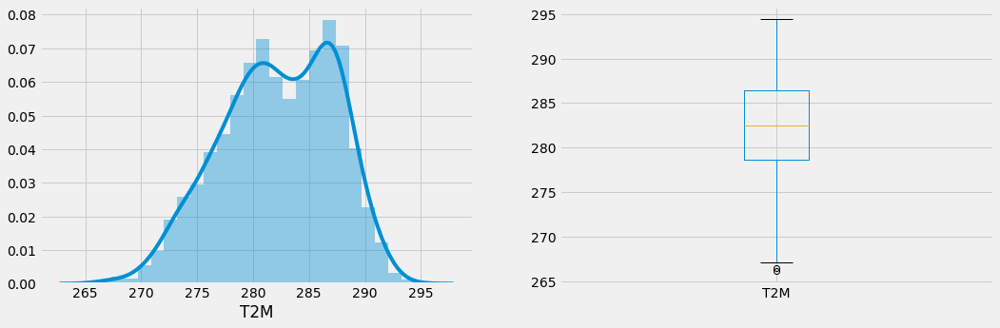

None
T2M plot for region : E12000004


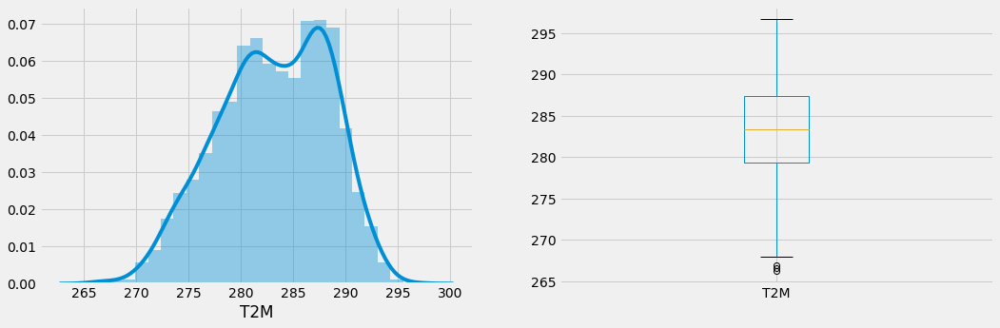

None
T2M plot for region : E12000005


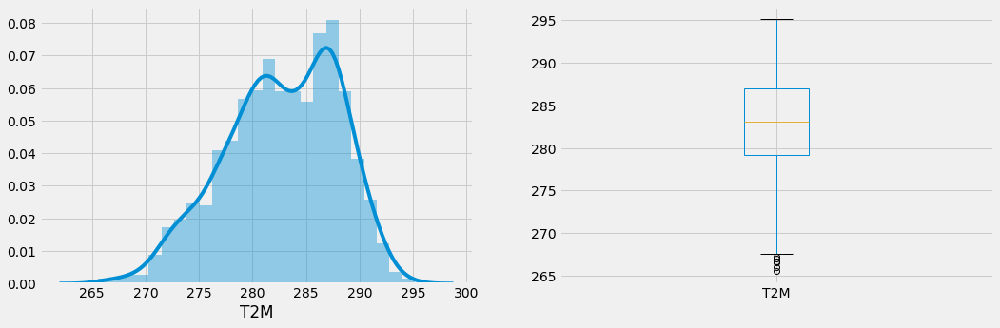

None
T2M plot for region : E12000006


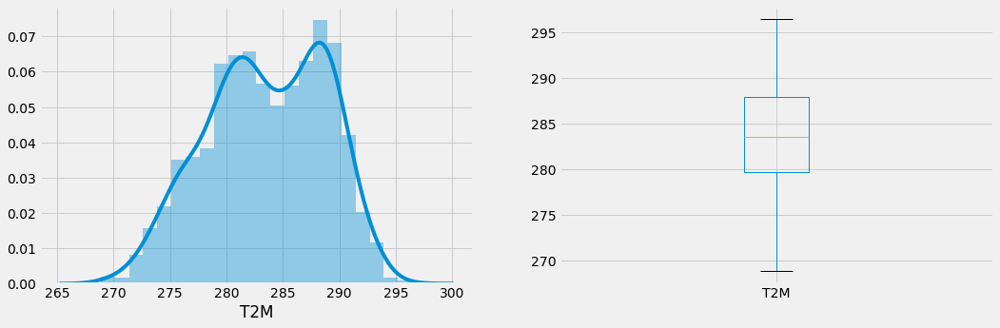

None
T2M plot for region : E12000007


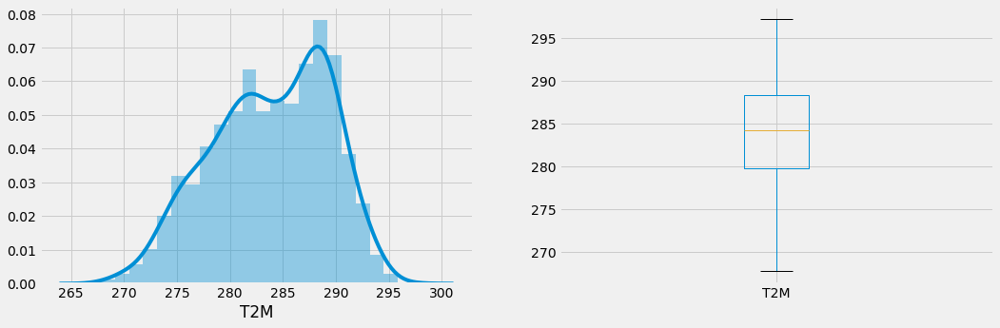

None
T2M plot for region : E12000008


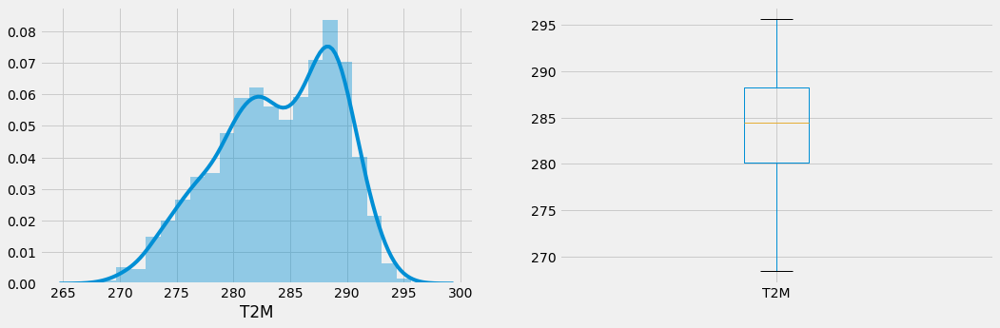

None
T2M plot for region : E12000009


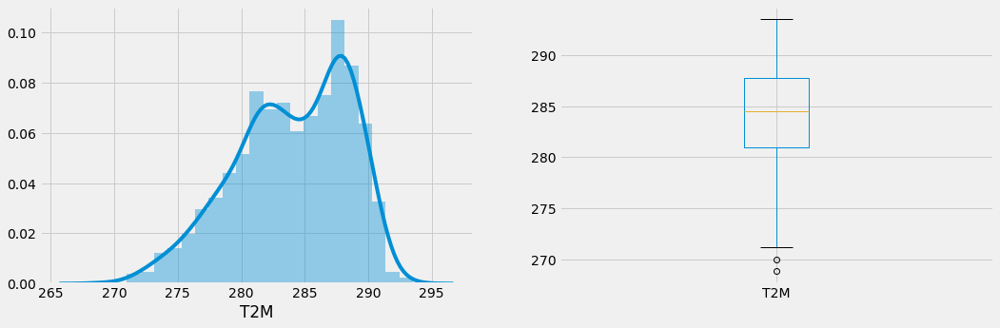

None


In [146]:
for r in train['region'].unique():
    t = train[train['region']==r]
    print("T2M plot for region :",r)
    print(plotuni('T2M',t))
    

In [51]:
#train1.groupby("region")["Region"].unique()

In [52]:
train1.head()

,region,date,mortality_rate,O3,PM10,PM25,NO2,T2M,Code,Region
0,E12000001,2007-01-02,2.264,42.358,9.021,NaN,NaN,278.138,E12000001,North East
1,E12000001,2007-01-03,2.030,49.506,5.256,NaN,NaN,281.745,E12000001,North East
2,E12000001,2007-01-04,1.874,51.101,4.946,NaN,NaN,280.523,E12000001,North East
3,E12000001,2007-01-05,2.069,47.478,6.823,NaN,NaN,280.421,E12000001,North East
4,E12000001,2007-01-06,1.913,45.226,7.532,NaN,NaN,278.961,E12000001,North East


## Transformations

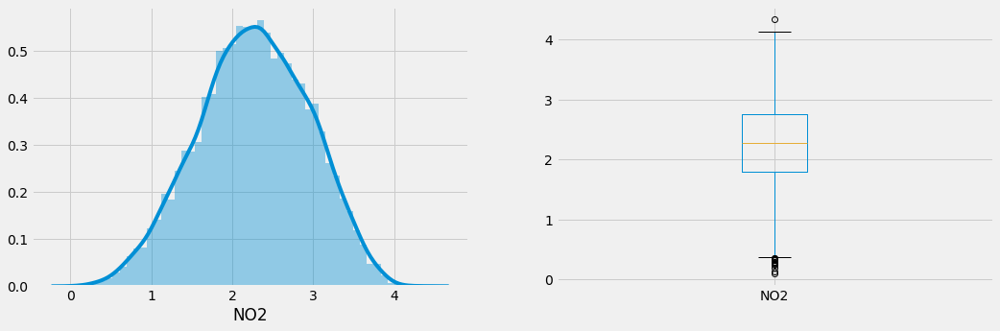

In [39]:
plotuni_log('NO2',train)

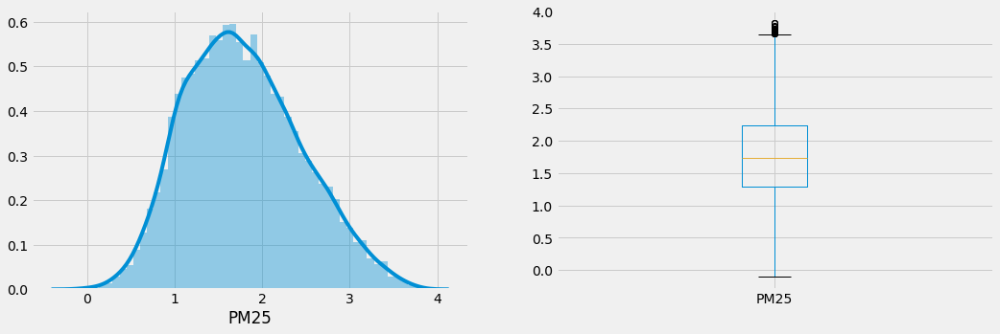

In [41]:
plotuni_log('PM25',train)

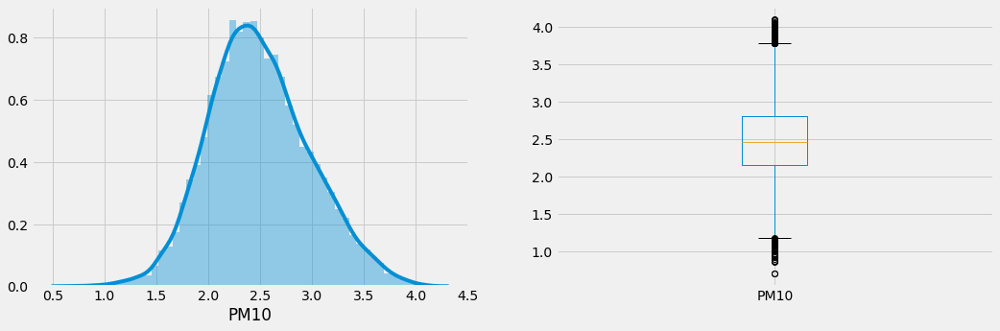

In [43]:
plotuni_log('PM10',train)

# Bivariate analysis - Region Wise

### variation with date - time series plot ##

### For region 1 - North East

In [53]:
train_r1 = train1[train1["Region"]=="North East"]
fig1 = px.line(train_r1, x='date', y='mortality_rate')
fig1.show()

In [54]:
fig2 = go.Figure([go.Scatter(x=train_r1['date'], y=train_r1['mortality_rate'])])
#fig2.show()

fig2.update_layout(title_text='Time Series with Rangeslider',
                  xaxis_rangeslider_visible=True)

In [55]:
fig3 = go.Figure([go.Scatter(x=train_r1['date'], y=train_r1["O3"])])
#fig2.show()

fig3.update_layout(title_text='Time Series with Rangeslider',
                  xaxis_rangeslider_visible=True)

In [56]:
fig2 = go.Figure([go.Scatter(x=train_r1['date'], y=train_r1["PM10"])])
#fig2.show()

fig2.update_layout(title_text='Time Series with Rangeslider',
                  xaxis_rangeslider_visible=True)

In [57]:
fig4 = go.Figure([go.Scatter(x=train_r1['date'], y=train_r1["PM25"])])
#fig2.show()

fig4.update_layout(title_text='Time Series with Rangeslider',
                  xaxis_rangeslider_visible=True)

In [58]:
fig5 = go.Figure([go.Scatter(x=train_r1['date'], y=train_r1["NO2"])])
#fig2.show()

fig5.update_layout(title_text='Time Series with Rangeslider',
                  xaxis_rangeslider_visible=True)

### scatter plot of PM25 with other varibles ###

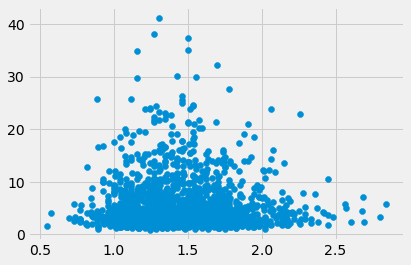

In [59]:
plt.scatter(x=train_r1['mortality_rate'], y=train_r1["PM25"])

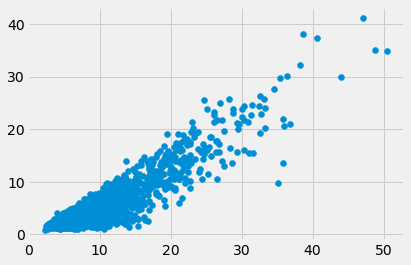

In [60]:
plt.scatter(x=train_r1['PM10'], y=train_r1["PM25"])

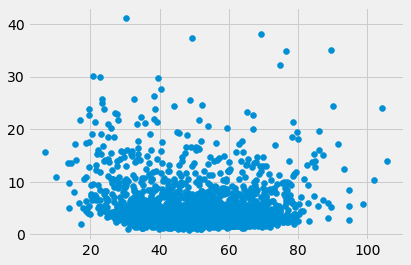

In [61]:
plt.scatter(x=train_r1['O3'], y=train_r1["PM25"])

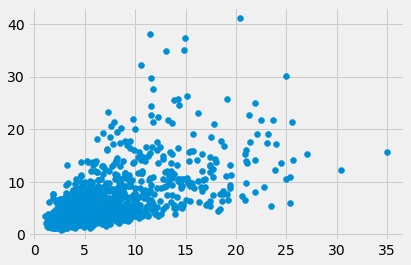

In [62]:
plt.scatter(x=train_r1['NO2'], y=train_r1["PM25"])

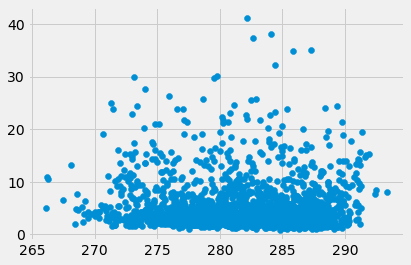

In [63]:
plt.scatter(x=train_r1['T2M'], y=train_r1["PM25"])

### scatter plot of NO2 with other variables ###

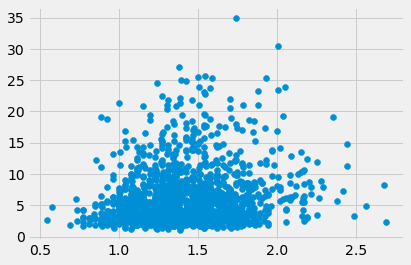

In [64]:
plt.scatter(x=train_r1['mortality_rate'], y=train_r1["NO2"])

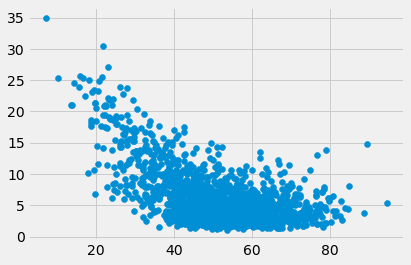

In [65]:
plt.scatter(x=train_r1['O3'], y=train_r1["NO2"])

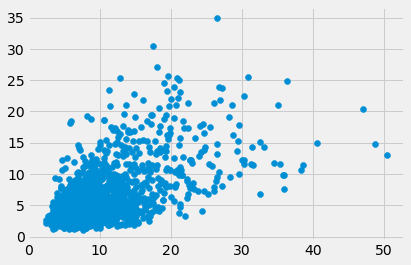

In [66]:
plt.scatter(x=train_r1['PM10'], y=train_r1["NO2"])

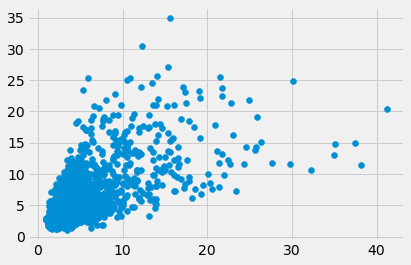

In [67]:
plt.scatter(x=train_r1['PM25'], y=train_r1["NO2"])

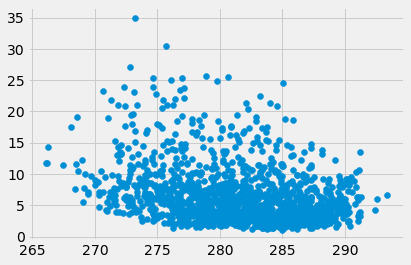

In [68]:
plt.scatter(x=train_r1['T2M'], y=train_r1["NO2"])

## Missing value imputation using MICE 

#### For Region1 - North East

In [69]:
train_r1.head()

,region,date,mortality_rate,O3,PM10,PM25,NO2,T2M,Code,Region
0,E12000001,2007-01-02,2.264,42.358,9.021,NaN,NaN,278.138,E12000001,North East
1,E12000001,2007-01-03,2.030,49.506,5.256,NaN,NaN,281.745,E12000001,North East
2,E12000001,2007-01-04,1.874,51.101,4.946,NaN,NaN,280.523,E12000001,North East
3,E12000001,2007-01-05,2.069,47.478,6.823,NaN,NaN,280.421,E12000001,North East
4,E12000001,2007-01-06,1.913,45.226,7.532,NaN,NaN,278.961,E12000001,North East


In [70]:
train_r1.isna().sum()

region              0
date                0
mortality_rate      0
O3                  1
PM10                1
PM25              364
NO2               730
T2M                 0
Code                0
Region              0
dtype: int64

In [71]:
train_r1.drop(columns=["region","date", "Code", "Region"], inplace=True)

C:\Users\deciPh3r\Anaconda3\lib\site-packages\pandas\core\frame.py:4102: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [72]:
from impyute.imputation.cs import mice

# start the MICE training
train_r1_imp=mice(train_r1.values)

In [73]:
train_r1_imp = pd.DataFrame(train_r1_imp, columns = ["mortality_rate", "O3", "PM10", "PM25","NO2","T2M"])

In [74]:
train_r1_imp.isna().sum()

mortality_rate    0
O3                0
PM10              0
PM25              0
NO2               0
T2M               0
dtype: int64

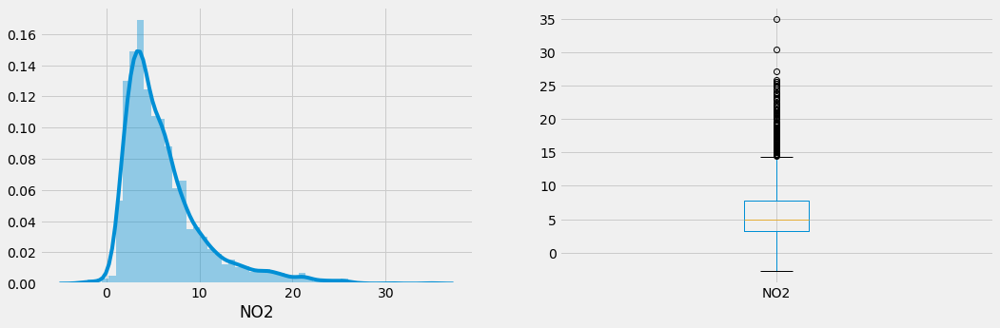

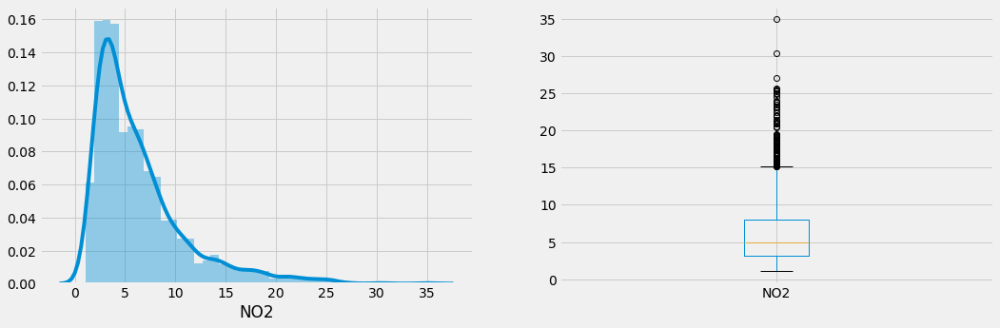

In [75]:
# Visualizing NO2
# plt.figure(1)
plt.subplot(121)
NO2_1 = train_r1_imp['NO2'].dropna()
sns.distplot(NO2_1);

plt.subplot(122)
NO2_1.plot.box(figsize=(16,5))

plt.show()


plt.subplot(121)
NO2_1 = train_r1['NO2'].dropna()
sns.distplot(NO2_1);

plt.subplot(122)
NO2_1.plot.box(figsize=(16,5))

plt.show()

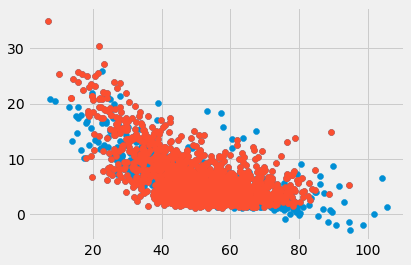

In [76]:
plt.scatter(x=train_r1_imp['O3'], y=train_r1_imp["NO2"])
plt.scatter(x=train_r1['O3'], y=train_r1["NO2"])

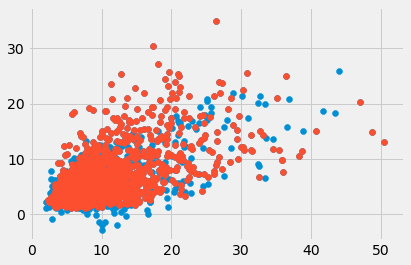

In [77]:
plt.scatter(x=train_r1_imp['PM10'], y=train_r1_imp["NO2"])
plt.scatter(x=train_r1['PM10'], y=train_r1["NO2"])

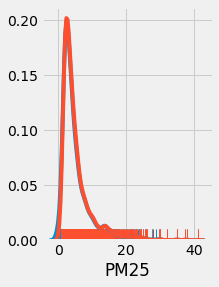

In [78]:
# Visualizing NO2
# plt.figure(1)
plt.subplot(121)
NO2_1_imp = train_r1_imp['PM25'].dropna()
NO2_1 = train_r1['PM25'].dropna()
#sns.distplot(NO2_1_imp)
#sns.distplot(NO2_1)

sns.distplot(NO2_1_imp, hist=False, rug=True)
sns.distplot(NO2_1, hist=False, rug=True)


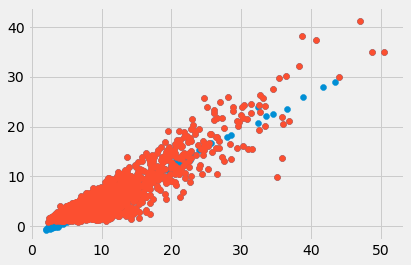

In [79]:
plt.scatter(x=train_r1_imp['PM10'], y=train_r1_imp["PM25"])
plt.scatter(x=train_r1['PM10'], y=train_r1["PM25"])

In [80]:
train_r1_imp['PM25'].describe(), train_r1['PM25'].describe()

(count    2191.000000
 mean        5.203044
 std         4.765004
 min        -0.656271
 25%         2.325434
 50%         3.636000
 75%         6.168487
 max        41.255000
 Name: PM25, dtype: float64, count    1827.000000
 mean        5.368816
 std         4.773007
 min         0.904000
 25%         2.451500
 50%         3.802000
 75%         6.269000
 max        41.255000
 Name: PM25, dtype: float64)

In [81]:
## changing negative values to min value
train_r1_imp['PM25'] = np.where(train_r1_imp['PM25']<=0, 0.904000, train_r1_imp['PM25'] )

In [82]:
train_r1_imp['NO2'].describe(), train_r1['NO2'].describe()

(count    2191.000000
 mean        6.164154
 std         4.378407
 min        -2.754285
 25%         3.228438
 50%         4.988000
 75%         7.738791
 max        34.990000
 Name: NO2, dtype: float64, count    1461.000000
 mean        6.353291
 std         4.572821
 min         1.104000
 25%         3.172000
 50%         4.988000
 75%         7.971000
 max        34.990000
 Name: NO2, dtype: float64)

In [83]:
## changing negative values to min value
train_r1_imp['NO2'] = np.where(train_r1_imp['NO2']<=0, 1.104000, train_r1_imp['NO2'] )

#### Since we are getting good enough results region wise we can impute PM25 and NO2 on the basis of regions

### Region wise imputation

In [84]:
train1.head()

,region,date,mortality_rate,O3,PM10,PM25,NO2,T2M,Code,Region
0,E12000001,2007-01-02,2.264,42.358,9.021,NaN,NaN,278.138,E12000001,North East
1,E12000001,2007-01-03,2.030,49.506,5.256,NaN,NaN,281.745,E12000001,North East
2,E12000001,2007-01-04,1.874,51.101,4.946,NaN,NaN,280.523,E12000001,North East
3,E12000001,2007-01-05,2.069,47.478,6.823,NaN,NaN,280.421,E12000001,North East
4,E12000001,2007-01-06,1.913,45.226,7.532,NaN,NaN,278.961,E12000001,North East


In [85]:
regions = list(region["Region"].values)
train_imp = pd.DataFrame()

for reg in regions:
    
    train_r = train1[train1["Region"] == reg].reset_index(drop=True)
    train_r_imp = mice(train_r.drop(["region","date", "Code", "Region"], axis = 1).values)
    train_r_imp = pd.DataFrame(train_r_imp, columns = ["mortality_rate", "O3", "PM10", "PM25","NO2","T2M"])
    
    ## changing negative values to min value
    train_r_imp['PM25'] = np.where(train_r_imp['PM25']<=0, min(train_r['PM25']), train_r_imp['PM25'] )
    
    ## changing negative values to min value
    train_r_imp['NO2'] = np.where(train_r_imp['NO2']<=0, min(train_r['NO2']), train_r_imp['NO2'] )
    
    print("\n\n")
    print("train_r = before", train_r.isna().sum())
    
    train_r['PM25'] = train_r_imp['PM25']
    train_r['NO2'] = train_r_imp['NO2']
    train_r['O3'] = train_r_imp['O3']
    train_r['PM10'] = train_r_imp['PM10']
    
    print("train_r_imp = \n", train_r_imp.isna().sum())
    print("train_r = \n", train_r.isna().sum())
    print("----------------------------------------")
    
    train_imp = train_imp.append(train_r)
    
print("train_imp = ", train_imp.isna().sum(), '\n')
    
    




train_r = before region              0
date                0
mortality_rate      0
O3                  1
PM10                1
PM25              364
NO2               730
T2M                 0
Code                0
Region              0
dtype: int64
train_r_imp = 
 mortality_rate     0
O3                 0
PM10               0
PM25              13
NO2                8
T2M                0
dtype: int64
train_r = 
 region             0
date               0
mortality_rate     0
O3                 0
PM10               0
PM25              13
NO2                8
T2M                0
Code               0
Region             0
dtype: int64
----------------------------------------



train_r = before region              0
date                0
mortality_rate      0
O3                  1
PM10                1
PM25              364
NO2               730
T2M                 0
Code                0
Region              0
dtype: int64
train_r_imp = 
 mortality_rate    0
O3                0
PM10   

In [86]:
pd.set_option('display.max_rows', None)
#train_imp
                                    

In [87]:
train_imp.head()

,region,date,mortality_rate,O3,PM10,PM25,NO2,T2M,Code,Region
0,E12000001,2007-01-02,2.264,42.358,9.021,3.992393,7.771759,278.138,E12000001,North East
1,E12000001,2007-01-03,2.030,49.506,5.256,1.336888,4.423773,281.745,E12000001,North East
2,E12000001,2007-01-04,1.874,51.101,4.946,1.246805,4.268166,280.523,E12000001,North East
3,E12000001,2007-01-05,2.069,47.478,6.823,2.474010,5.627964,280.421,E12000001,North East
4,E12000001,2007-01-06,1.913,45.226,7.532,3.145688,6.555185,278.961,E12000001,North East


In [88]:
temp_r_imp = mice(train_imp.drop(columns=['region','date','Code','Region']).values)
temp_r_imp = pd.DataFrame(temp_r_imp, columns = ["mortality_rate", "O3", "PM10", "PM25","NO2","T2M"])

train_r_imp_full = train_imp.copy()
train_r_imp_full["NO2"] = temp_r_imp["NO2"]
train_r_imp_full["PM25"] = temp_r_imp["PM25"]
train_r_imp_full["O3"] = temp_r_imp["O3"]
train_r_imp_full["PM10"] = temp_r_imp["PM10"]

train_r_imp_full.isna().sum()  #### FINAL DATAFRAME WITH IMPUTED VALUES REGION WISE

region            0
date              0
mortality_rate    0
O3                0
PM10              0
PM25              0
NO2               0
T2M               0
Code              0
Region            0
dtype: int64

In [89]:
train_r_imp_full.shape, train1.shape

((18403, 10), (18403, 10))

In [90]:
train_r_imp_full.head()

,region,date,mortality_rate,O3,PM10,PM25,NO2,T2M,Code,Region
0,E12000001,2007-01-02,2.264,42.358,9.021,3.992393,7.771759,278.138,E12000001,North East
1,E12000001,2007-01-03,2.030,49.506,5.256,1.336888,4.423773,281.745,E12000001,North East
2,E12000001,2007-01-04,1.874,51.101,4.946,1.246805,4.268166,280.523,E12000001,North East
3,E12000001,2007-01-05,2.069,47.478,6.823,2.474010,5.627964,280.421,E12000001,North East
4,E12000001,2007-01-06,1.913,45.226,7.532,3.145688,6.555185,278.961,E12000001,North East


In [91]:
train_r_imp_full['NO2'].describe()

count    18403.000000
mean         6.137423
std          4.403698
min         -5.495204
25%          3.220000
50%          4.971415
75%          7.737107
max         34.990000
Name: NO2, dtype: float64

In [92]:
train1['NO2'].describe()

count    11833.000000
mean        12.045813
std          8.296675
min          1.104000
25%          6.056000
50%          9.769000
75%         15.858000
max         76.765000
Name: NO2, dtype: float64

In [93]:
train_r_imp_full['PM25'].describe()

count    18403.000000
mean         5.162043
std          4.756403
min         -0.993929
25%          2.272000
50%          3.572000
75%          6.127000
max         41.255000
Name: PM25, dtype: float64

In [94]:
train1['PM25'].describe()

count    15127.000000
mean         7.498714
std          5.758357
min          0.904000
25%          3.624000
50%          5.636000
75%          9.326500
max         45.846000
Name: PM25, dtype: float64

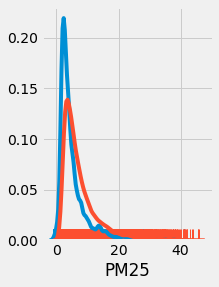

In [95]:
plt.subplot(121)
NO2_1= train1['PM25'].dropna()
NO2_1_imp  = train_r_imp_full['PM25'].dropna()

sns.distplot(NO2_1_imp, hist=False, rug=True)
sns.distplot(NO2_1, hist=False, rug=True)

Region wise imputation is fine but at an overall level it does not suits well..

### Impution on full data - MICE

In [96]:
# start the MICE training
temp_imp = mice(train1.drop(["region","date", "Code", "Region"], axis = 1).values)
temp_imp = pd.DataFrame(temp_imp, columns = ["mortality_rate", "O3", "PM10", "PM25","NO2","T2M"])

train_full_imp = train1.copy()
train_full_imp["NO2"] = temp_imp["NO2"]
train_full_imp["PM25"] = temp_imp["PM25"]
train_full_imp["O3"] = temp_imp["O3"]
train_full_imp["PM10"] = temp_imp["PM10"]

In [97]:
train_full_imp.isna().sum() ### FINAL DATAFRAME WITH IMPUTATION ON FULL DATA

region            0
date              0
mortality_rate    0
O3                0
PM10              0
PM25              0
NO2               0
T2M               0
Code              0
Region            0
dtype: int64

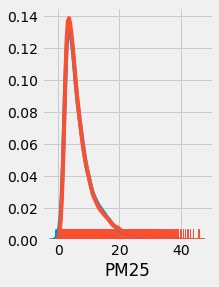

In [98]:
plt.subplot(121)
NO2_1= train1['PM25'].dropna()
NO2_1_imp  = train_full_imp['PM25'].dropna()

sns.distplot(NO2_1_imp, hist=False, rug=True)
sns.distplot(NO2_1, hist=False, rug=True)

# Dropping Missing Values

## Feature Engineering

one hot encoding for regions

In [99]:
dummy1= pd.get_dummies(train['region'])
train_f = train.join(dummy1)

dummy2= pd.get_dummies(test['region'])
test_f = test.join(dummy2)

In [100]:
train_f.shape,test_f.shape

((18403, 17), (7886, 16))

doy (day of year) and year

In [101]:
train_f['year'] = train_f['date'].map(lambda x: x.year)
test_f['year'] = test_f['date'].map(lambda x: x.year)

train_f['year^2'] = train_f['year']**2
test_f['year^2'] = test_f['year']**2

train_f['doy'] = train_f['date'].map(lambda x: x.dayofyear)
test_f['doy'] = test_f['date'].map(lambda x: x.dayofyear)

train_f['doy^2'] = train_f['doy']**2
test_f['doy^2'] = test_f['doy']**2

Log Transformation

In [102]:
train_f['NO2_log']=np.log(train_f['NO2'])
train_f['PM10_log']=np.log(train_f['PM10'])
train_f['PM25_log']=np.log(train_f['PM25'])

test_f['NO2_log']=np.log(test_f['NO2'])
test_f['PM10_log']=np.log(test_f['PM10'])
test_f['PM25_log']=np.log(test_f['PM25'])

In [103]:
#train_f.info(),test_f.info()

In [104]:
total_f=total=pd.concat([train_f,test_f],sort=False)

In [105]:
total_f['T2M_rolling'] = total_f.groupby('region')['T2M'].transform(lambda x: x.rolling(30).mean())

In [106]:
total_f.shape

(26289, 25)

## Modelling

In [107]:
train_f=total_f[:18403].dropna()
test_f=total_f[18403:].drop(['mortality_rate'],axis=1)

In [108]:
train_f.shape,test_f.shape

((11833, 25), (7886, 24))

In [109]:
X_train, X_test, y_train, y_test = train_test_split(train_f.drop(['mortality_rate'],axis=1), train_f['mortality_rate'], test_size=0.2)

In [110]:
RMSE= make_scorer(metrics.mean_squared_error)

In [111]:
X=train_f.drop(['mortality_rate'],axis=1)
y=train_f['mortality_rate']

### Predictor Set 1

In [112]:
predictors=['O3','PM10','PM25','NO2','T2M']

#### Regularized Linear Regression without CV

##### Ridge Regression

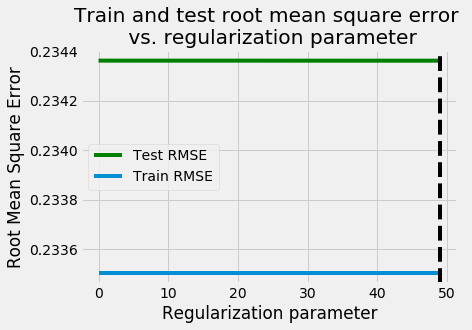

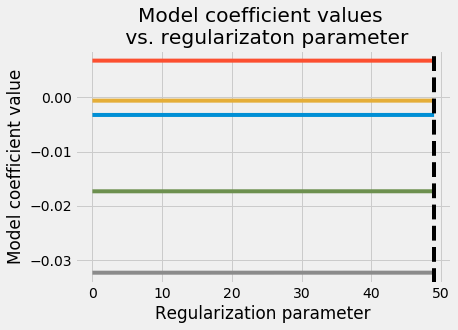

(49, 0.23436246569299343)

MSE = 0.054925765325699524
RMSE =0.23436246569299343
Mean Absolute Error =0.18307320123963078
Median Absolute Error  = 0.15209967613369968
R^2                    = 0.34669221311633325


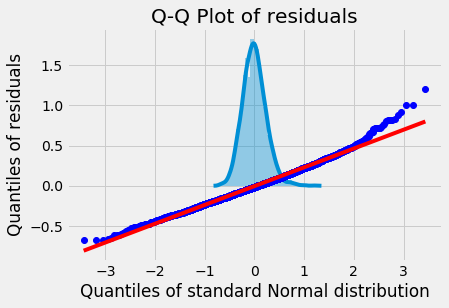

ValueError: Input passed into argument "'y1'"is not 1-dimensional.

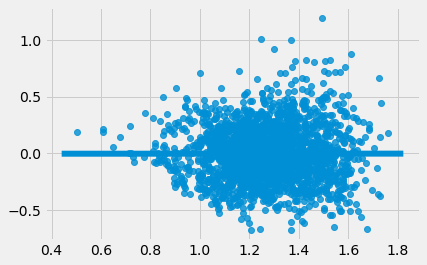

In [113]:
ridge(X_train[predictors],y_train,X_test[predictors],y_test)

##### Lasso Regression

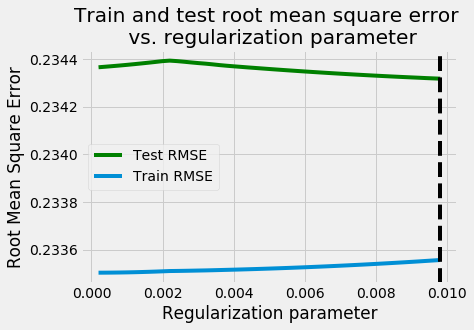

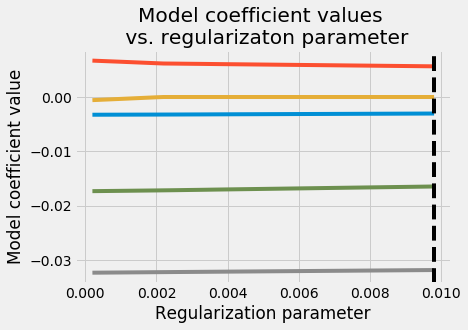

(0.0098, 0.23431716389671567)

MSE = 0.05490453329660032
RMSE =0.23431716389671567
Mean Absolute Error =0.18297643706847325
Median Absolute Error  = 0.1522334085242789
R^2                    = 0.3469447548853847


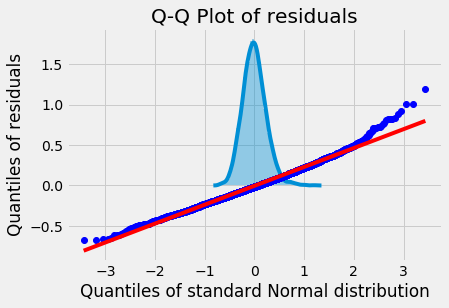

ValueError: Input passed into argument "'y1'"is not 1-dimensional.

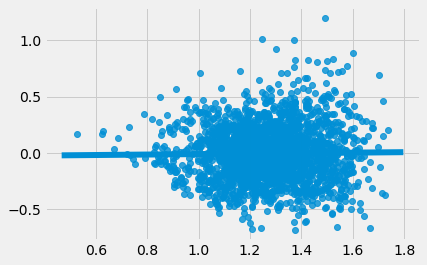

In [114]:
lasso(X_train[predictors],y_train,X_test[predictors],y_test)

#### CV Model

In [115]:
models = [
    LinearRegression(),
    linear_model.Lasso(alpha=0.0098),
    Ridge(alpha=49),
    RandomForestRegressor(max_depth=2, random_state=0),
]
CV = 5
for model in models:
    model_name = model.__class__.__name__
    
    accuracies = cross_val_score(model,X[predictors], y,scoring=RMSE, cv=CV)
    
    print(model_name,"RMSE",np.sqrt(accuracies),"\n")
    print("average RMSE :", np.sqrt(accuracies).mean(),"\n","\n")

LinearRegression RMSE [0.25590564 0.2384088  0.23534413 0.24975171 0.21540355] 

average RMSE : 0.2389627659994164 
 

Lasso RMSE [0.25663464 0.23869078 0.23564212 0.24957773 0.21430635] 

average RMSE : 0.23897032276208613 
 

Ridge RMSE [0.25591206 0.23841334 0.23534448 0.24975198 0.21539392] 

average RMSE : 0.2389631575777995 
 

RandomForestRegressor RMSE [0.27209648 0.25170445 0.26211702 0.26120663 0.21941687] 

average RMSE : 0.2533082876488943 
 



### Predictor Set 2

In [116]:
predictors=['O3','PM10','PM25','NO2_log','T2M']

#### Regularized Linear Regression without CV

##### Ridge Regression

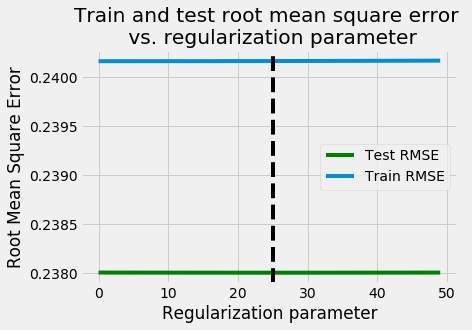

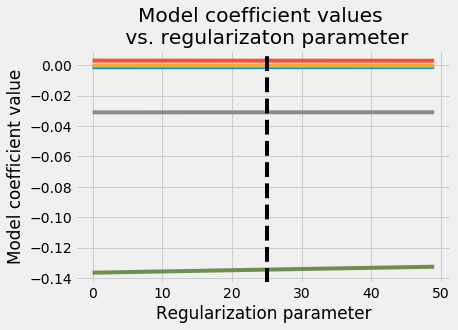

(25, 0.23800193040077172)

MSE = 0.05664491887449379
RMSE =0.23800193040077172
Mean Absolute Error =0.18713251159771382
Median Absolute Error  = 0.15374116464634047
R^2                    = 0.32624395183829746


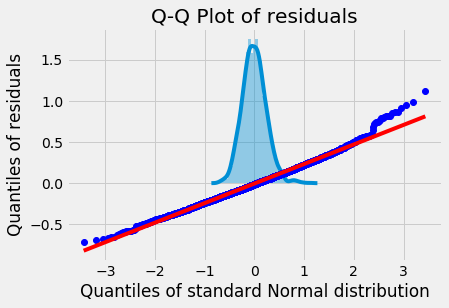

ValueError: Input passed into argument "'y1'"is not 1-dimensional.

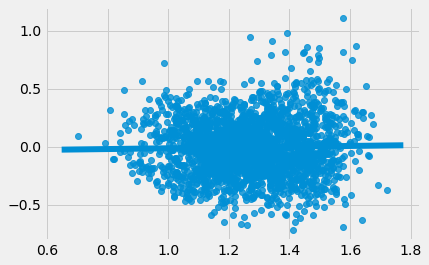

In [117]:
ridge(X_train[predictors],y_train,X_test[predictors],y_test)

##### Lasso Regression

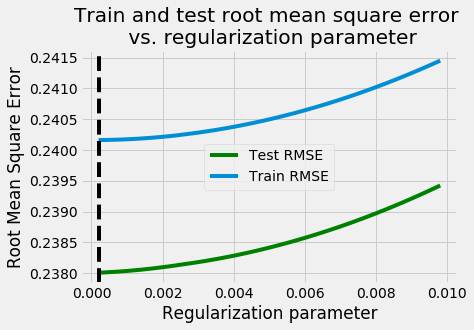

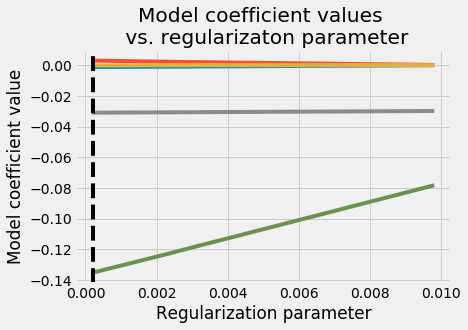

(0.0002, 0.23800782096708173)

MSE = 0.056647722841498424
RMSE =0.23800782096708173
Mean Absolute Error =0.18714769438460058
Median Absolute Error  = 0.1536363013610369
R^2                    = 0.32621060039626604


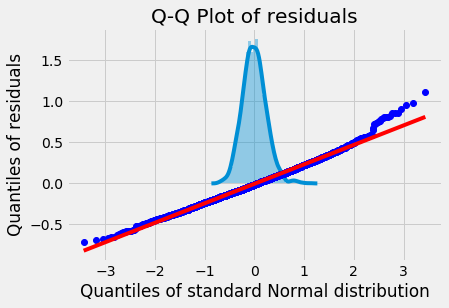

ValueError: Input passed into argument "'y1'"is not 1-dimensional.

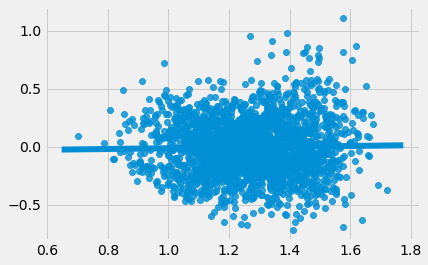

In [118]:
lasso(X_train[predictors],y_train,X_test[predictors],y_test)

In [ ]:
models = [
    LinearRegression(),
    linear_model.Lasso(alpha=0.002),
    Ridge(alpha=25),
    RandomForestRegressor(max_depth=2, random_state=0),
]
CV = 5
for model in models:
    model_name = model.__class__.__name__
    
    accuracies = cross_val_score(model,X[predictors], y,scoring=RMSE, cv=CV)
    
    print(model_name,"RMSE",np.sqrt(accuracies),"\n")
    print("average RMSE :", np.sqrt(accuracies).mean(),"\n","\n")

-LinearRegression      0.2453372337810475 
-Lasso                 0.25363080541258476  
-Ridge                 0.24533682390299894 
-RandomForestRegressor 0.253308657930002   

-LB socre
-LinearRegression  0.   
-Lasso             0. 
-Ridge             0. 
-RandomForestRegressor 0. 

### Predictor Set 3

In [119]:
predictors=['O3','PM10','PM25_log','NO2_log','T2M']

#### Regularized Linear Regression without CV

##### Ridge Regression

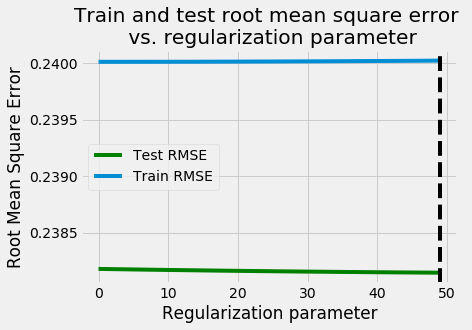

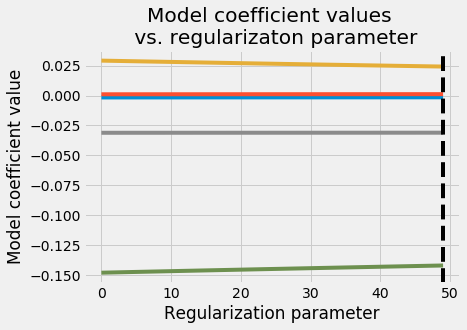

(49, 0.23814715658992514)

MSE = 0.05671406819186632
RMSE =0.23814715658992514
Mean Absolute Error =0.18731822231189993
Median Absolute Error  = 0.1541089692668931
R^2                    = 0.32542146375407544


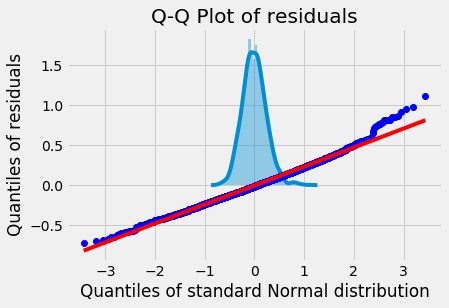

ValueError: Input passed into argument "'y1'"is not 1-dimensional.

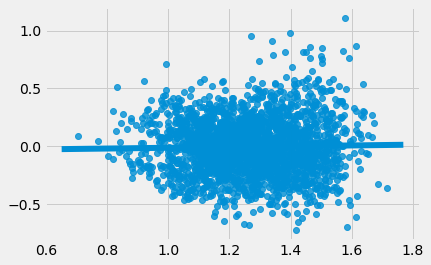

In [120]:
ridge(X_train[predictors],y_train,X_test[predictors],y_test)

##### Lasso Regression

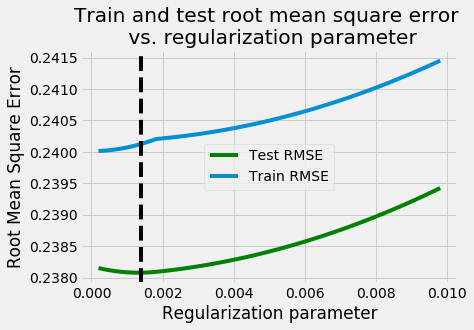

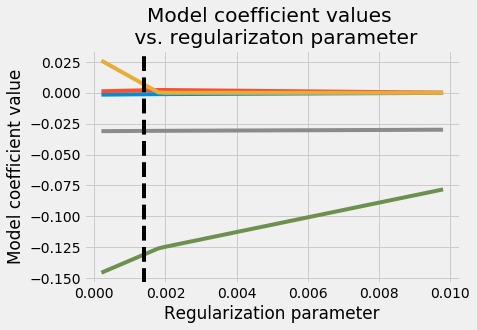

(0.0014, 0.23807858356244185)

MSE = 0.05668141195109861
RMSE =0.23807858356244185
Mean Absolute Error =0.18711037171620618
Median Absolute Error  = 0.15393282056146673
R^2                    = 0.32580988940927347


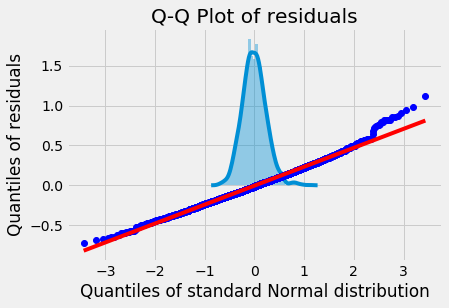

ValueError: Input passed into argument "'y1'"is not 1-dimensional.

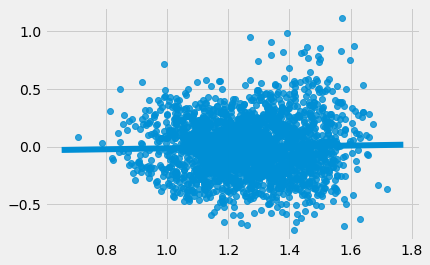

In [121]:
lasso(X_train[predictors],y_train,X_test[predictors],y_test)

In [ ]:
models = [
    LinearRegression(),
    Lasso(alpha=0.0014),
    Ridge(alpha=49),
    RandomForestRegressor(max_depth=2)
]
CV = 5
for model in models:
    model_name = model.__class__.__name__
    
    accuracies = cross_val_score(model,X[predictors], y,scoring=RMSE, cv=CV)
    
    print(model_name,"RMSE",np.sqrt(accuracies),"\n")
    print("average RMSE :", np.sqrt(accuracies).mean(),"\n","\n")

-LinearRegression      0.24551812699677633 
-Lasso                 0.25364131894103525  
-Ridge                 0.2455161592022304     
-RandomForestRegressor 0.253308657930002   

-LB socre
-LinearRegression  0. 
-Lasso             0.  
-Ridge             0.  
-RandomForestRegressor 0. 

### Predictor Set 4

In [122]:
predictors=['O3','PM10_log','PM25_log','NO2_log','T2M']

#### Regularized Linear Regression without CV

##### Ridge Regression

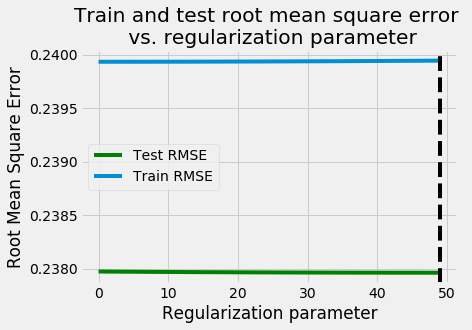

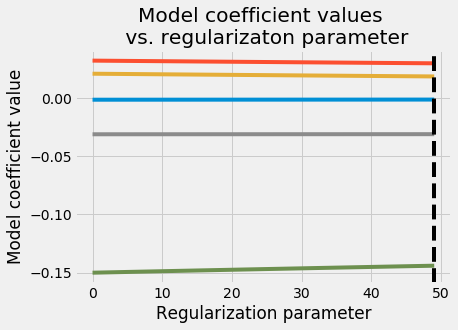

(49, 0.23796126562609415)

MSE = 0.056625563938372536
RMSE =0.23796126562609415
Mean Absolute Error =0.18719584891816818
Median Absolute Error  = 0.15407753009706138
R^2                    = 0.3264741667548794


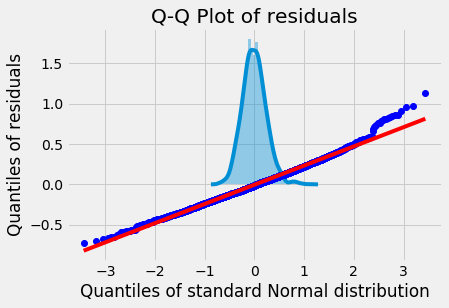

ValueError: Input passed into argument "'y1'"is not 1-dimensional.

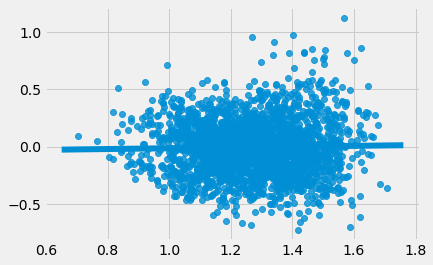

In [123]:
ridge(X_train[predictors],y_train,X_test[predictors],y_test)

##### Lasso Regression

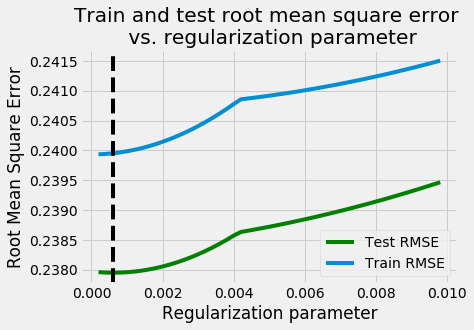

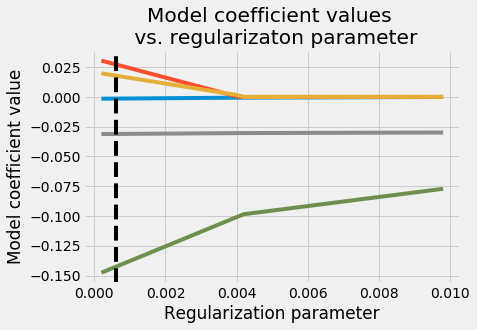

(0.0006, 0.2379513695491302)

MSE = 0.05662085427030673
RMSE =0.2379513695491302
Mean Absolute Error =0.18719209412773438
Median Absolute Error  = 0.15386910394472797
R^2                    = 0.32653018532472144


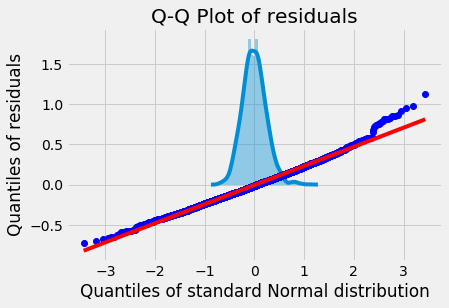

ValueError: Input passed into argument "'y1'"is not 1-dimensional.

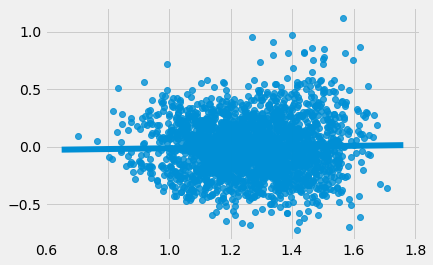

In [124]:
lasso(X_train[predictors],y_train,X_test[predictors],y_test)

In [ ]:
models = [
    LinearRegression(),
    Lasso(alpha=0.0006),
    Ridge(alpha=49),
    RandomForestRegressor(max_depth=2, random_state=0),
]
CV = 5
for model in models:
    model_name = model.__class__.__name__
    
    accuracies = cross_val_score(model,X[predictors], y,scoring=RMSE, cv=CV)
    
    print(model_name,"RMSE",np.sqrt(accuracies),"\n")
    print("average RMSE :", np.sqrt(accuracies).mean(),"\n","\n")

-LinearRegression      0.24552977824727984 
-Lasso                 0.2536717498662236   
-Ridge                 0.2455272255973945      
-RandomForestRegressor 0.253308657930002   

-LB socre
-LinearRegression  0. 
-Lasso             0. 
-Ridge              0.  
-RandomForestRegressor 0. 

### Predictor Set 5

In [125]:
predictors=['O3','PM10_log','PM25_log','NO2_log','T2M_rolling']

#### Regularized Linear Regression without CV

##### Ridge Regression

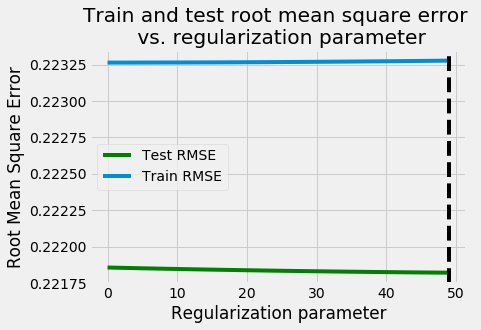

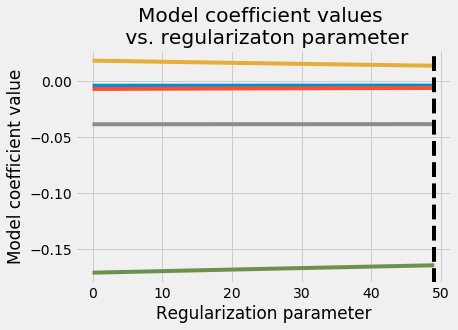

(49, 0.2218202458772421)

MSE = 0.049204221481040145
RMSE =0.2218202458772421
Mean Absolute Error =0.17501537983936058
Median Absolute Error  = 0.14549943796474263
R^2                    = 0.41474641544828195


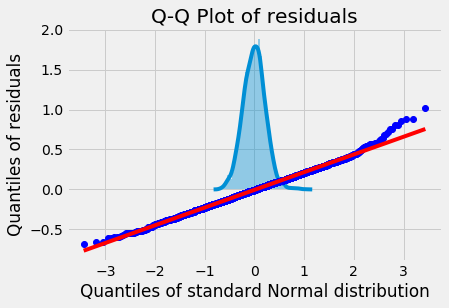

ValueError: Input passed into argument "'y1'"is not 1-dimensional.

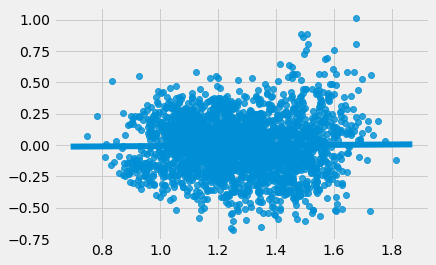

In [126]:
ridge(X_train[predictors],y_train,X_test[predictors],y_test)

##### Lasso Regression

In [ ]:
lasso(X_train[predictors],y_train,X_test[predictors],y_test)

In [127]:
models = [
    LinearRegression(),
    Lasso(alpha=0.0014),
    Ridge(alpha=49),
    RandomForestRegressor(max_depth=2, random_state=0),
]
CV = 5
for model in models:
    model_name = model.__class__.__name__
    
    accuracies = cross_val_score(model,X[predictors], y,scoring=RMSE, cv=CV)
    
    print(model_name,"RMSE",np.sqrt(accuracies),"\n")
    print("average RMSE :", np.sqrt(accuracies).mean(),"\n","\n")

LinearRegression RMSE [0.25155239 0.22712925 0.23355815 0.23378694 0.19377511] 

average RMSE : 0.22796036576314532 
 

Lasso RMSE [0.25187297 0.22612061 0.2337834  0.23291547 0.19286488] 

average RMSE : 0.22751146488059515 
 

Ridge RMSE [0.25174193 0.22702235 0.23370858 0.23353807 0.19326326] 

average RMSE : 0.2278548399142383 
 

RandomForestRegressor RMSE [0.27247375 0.245499   0.25977973 0.25826535 0.1943188 ] 

average RMSE : 0.2460673252607887 
 



-LinearRegression      0.22796036576314532 
-Lasso                 0.24235147415525443   
-Ridge                 0.2279576652270535  
-RandomForestRegressor 0.2460673252607887 

-LB score
-LinearRegression  0.  
-Lasso             0.
-Ridge              0.  
-RandomForestRegressor 0. 

### Predictor Set 6

In [128]:
predictors=['O3','PM10_log','PM25_log','NO2_log','T2M_rolling','year','year^2','doy','doy^2']

#### Regularized Linear Regression without CV

##### Ridge Regression

C:\Users\deciPh3r\Anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:148: LinAlgWarning:

Ill-conditioned matrix (rcond=3.26216e-17): result may not be accurate.



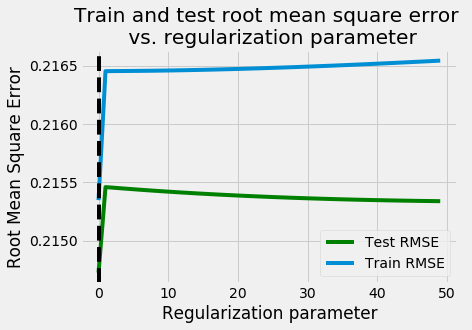

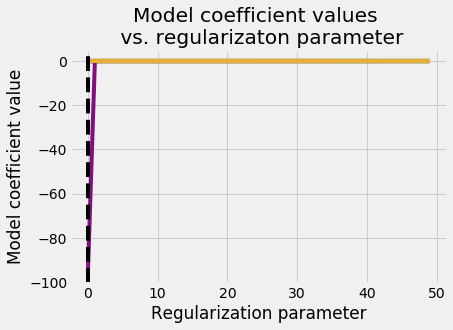

(0, 0.21472452712014956)

MSE = 0.04610662254697184
RMSE =0.21472452712014956
Mean Absolute Error =0.17058173107732685
Median Absolute Error  = 0.1447572395628085
R^2                    = 0.4515904264924483


C:\Users\deciPh3r\Anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:148: LinAlgWarning:

Ill-conditioned matrix (rcond=3.26216e-17): result may not be accurate.



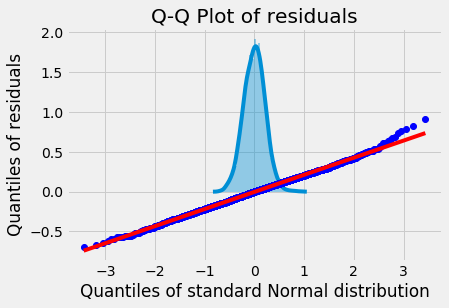

ValueError: Input passed into argument "'y1'"is not 1-dimensional.

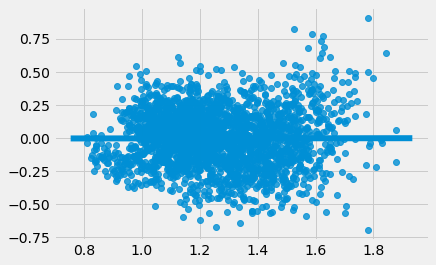

In [132]:
ridge(X_train[predictors],y_train,X_test[predictors],y_test)

##### Lasso Regression

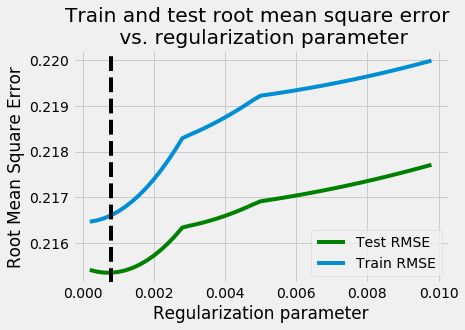

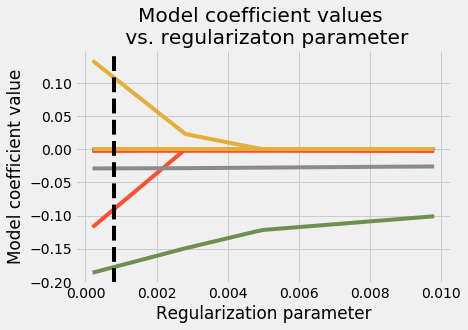

(0.0008, 0.21534732574447957)

MSE = 0.046374470705298994
RMSE =0.21534732574447957
Mean Absolute Error =0.17087664783461462
Median Absolute Error  = 0.1463411791138316
R^2                    = 0.4484045393864621


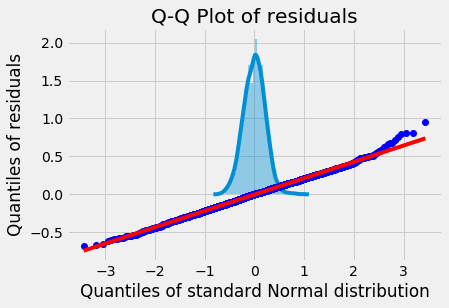

ValueError: Input passed into argument "'y1'"is not 1-dimensional.

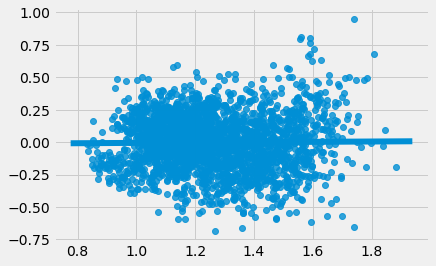

In [133]:
lasso(X_train[predictors],y_train,X_test[predictors],y_test)

In [134]:
models = [
    LinearRegression(),
    Lasso(alpha=0.008),
    Ridge(alpha=1.0),
    RandomForestRegressor(max_depth=2),
]
CV = 5
for model in models:
    model_name = model.__class__.__name__
    
    accuracies = cross_val_score(model,X[predictors], y,scoring=RMSE, cv=CV)
    
    print(model_name,"RMSE",np.sqrt(accuracies),"\n")
    print("average RMSE :", np.sqrt(accuracies).mean(),"\n","\n")

LinearRegression RMSE [0.23254874 0.23921699 0.22731851 0.22662792 0.35888154] 

average RMSE : 0.25691874212490495 
 

Lasso RMSE [0.24250605 0.22246162 0.23097633 0.23652245 0.22269063] 

average RMSE : 0.2310314152454036 
 

Ridge RMSE [0.23454083 0.22509922 0.23005836 0.23010584 0.2357758 ] 

average RMSE : 0.23111601199135615 
 

RandomForestRegressor RMSE [0.2660903  0.23979225 0.25490955 0.261559   0.1911597 ] 

average RMSE : 0.24270215726909528 
 



-LinearRegression      0.25691874212490495  
-Lasso                 0.24943533679256355  
-Ridge                 0.23111601199135615     
-RandomForestRegressor 0.2435420386323374  

-LB score
-LinearRegression  0.  
-Lasso             0.
-Ridge              0.  
-RandomForestRegressor 0. 

### Predictor Set 7

In [135]:
predictors=['T2M_rolling', 'year', 'year^2', 'doy', 'doy^2','E12000001', 'E12000002', 'E12000003', 'E12000004','E12000005', 'E12000006', 'E12000007', 'E12000008']

#### Regularized Linear Regression without CV

##### Ridge Regression

C:\Users\deciPh3r\Anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:148: LinAlgWarning:

Ill-conditioned matrix (rcond=3.54111e-17): result may not be accurate.



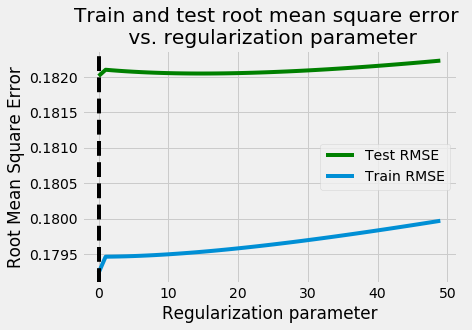

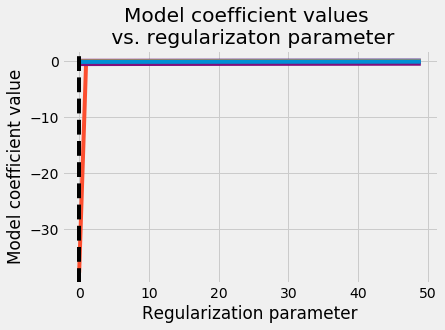

(0, 0.18201581587379362)

MSE = 0.03312975722820274
RMSE =0.18201581587379362
Mean Absolute Error =0.14063951177756304
Median Absolute Error  = 0.11430724792060198
R^2                    = 0.6059421612715664


C:\Users\deciPh3r\Anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:148: LinAlgWarning:

Ill-conditioned matrix (rcond=3.54111e-17): result may not be accurate.



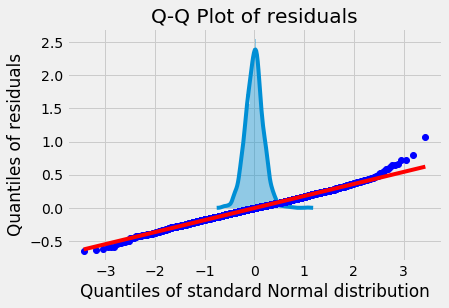

ValueError: Input passed into argument "'y1'"is not 1-dimensional.

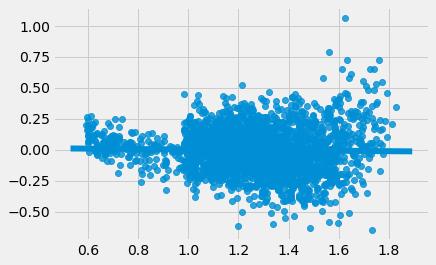

In [136]:
ridge(X_train[predictors],y_train,X_test[predictors],y_test)

##### Lasso Regression

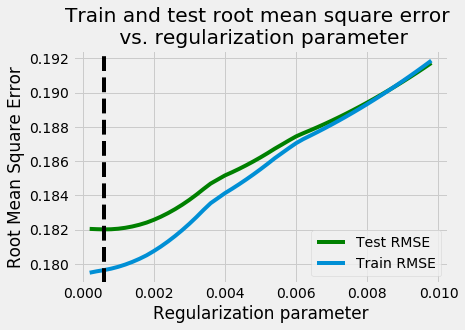

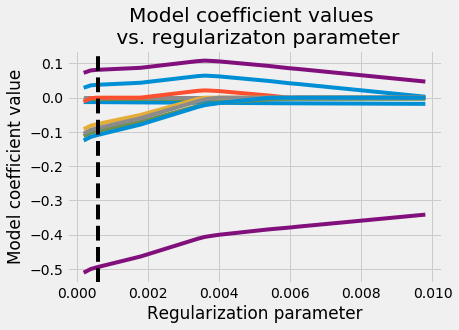

(0.0006, 0.18201555941819234)

MSE = 0.03312966387031751
RMSE =0.18201555941819234
Mean Absolute Error =0.14072824528189753
Median Absolute Error  = 0.11183665607109794
R^2                    = 0.6059432717054953


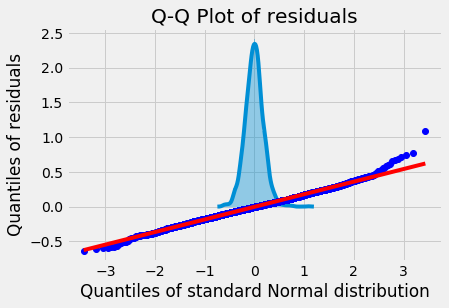

ValueError: Input passed into argument "'y1'"is not 1-dimensional.

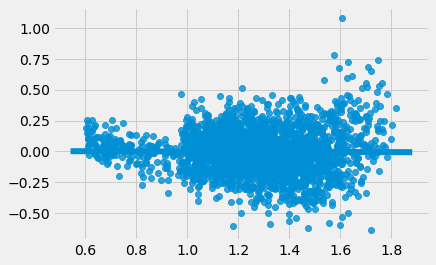

In [137]:
lasso(X_train[predictors],y_train,X_test[predictors],y_test)

In [138]:
models = [
    LinearRegression(),
    Lasso(alpha=0.006),
    Ridge(alpha=1.0),
    RandomForestRegressor(max_depth=2, random_state=0),
]
CV = 5
for model in models:
    model_name = model.__class__.__name__
    
    accuracies = cross_val_score(model,X[predictors], y,scoring=RMSE, cv=CV)
    
    print(model_name,"RMSE",np.sqrt(accuracies),"\n")
    print("average RMSE :", np.sqrt(accuracies).mean(),"\n","\n")

LinearRegression RMSE [0.20415681 0.18456036 0.17517828 0.16492889 0.24821156] 

average RMSE : 0.19540717885674203 
 

Lasso RMSE [0.21026374 0.19406697 0.18058726 0.1820534  0.20290798] 

average RMSE : 0.19397586988636187 
 

Ridge RMSE [0.2017823  0.18332612 0.17372941 0.16563076 0.19561269] 

average RMSE : 0.18401625729827167 
 

RandomForestRegressor RMSE [0.24741372 0.22554667 0.19961574 0.21522269 0.19597469] 

average RMSE : 0.2167547019932517 
 



### Best Predictors

In [139]:
predictors1=['NO2_log', 'year', 'year^2', 'doy', 'doy^2','PM10_log']
predictors2=['T2M_rolling', 'year', 'year^2', 'doy', 'doy^2','E12000001', 'E12000002', 'E12000003', 'E12000004','E12000005', 'E12000006', 'E12000007', 'E12000008']
predictors3=['E12000001', 'E12000002', 'E12000003', 'E12000004','E12000005', 'E12000006', 'E12000007', 'E12000008']

In [140]:
pred = [
    predictors1,
    predictors2,
    predictors3,
]
for preds in pred:
    #model_name = model.__class__.__name__
    
    accuracies = cross_val_score(LinearRegression(),X[preds], y,scoring=RMSE, cv=CV)
    
    print(model_name,"RMSE",np.sqrt(accuracies),"\n")
    print("average RMSE :", np.sqrt(accuracies).mean(),"\n","\n")

RandomForestRegressor RMSE [0.23201375 0.26048128 0.22666889 0.25644528 0.42542438] 

average RMSE : 0.28020671583860196 
 

RandomForestRegressor RMSE [0.20415681 0.18456036 0.17517828 0.16492889 0.24821156] 

average RMSE : 0.19540717885674203 
 

RandomForestRegressor RMSE [0.28887085 0.26111306 0.24310381 0.22983521 0.22967401] 

average RMSE : 0.25051938878501434 
 



### Final Algo - mixed LR


Notation:
X0 - training predictors
y0 - training target
X1 - test predictors
y1 - predictions


In [141]:
a = LinearRegression()
b = LinearRegression()
c = LinearRegression()
ab = LinearRegression()

In [142]:

y0 = train_f['mortality_rate']



#modela
a_predictors = ['NO2_log', 'year', 'year^2', 'doy', 'doy^2','PM10_log']
a_X0 = train_f[a_predictors]
a.fit(a_X0, y0)



#modelb
b_predictors = [
        'T2M_rolling', 'year', 'year^2', 'doy', 'doy^2',
        'E12000001', 'E12000002', 'E12000003', 'E12000004',
        'E12000005', 'E12000006', 'E12000007', 'E12000008'
        ]
b_X0 = train_f[b_predictors]
b.fit(b_X0, y0)



#modelc
c_predictors = [
        'E12000001', 'E12000002', 'E12000003', 'E12000004',
        'E12000005', 'E12000006', 'E12000007', 'E12000008'
        ]
c_X0 = train_f[c_predictors]
c.fit(c_X0, y0)


region_effect_reduction = 0.85


# Model AB
# Produces the final solution. Combines A and "reduced B" by using their predictions as features for a linear regression.

ab_X0 = pd.DataFrame({
    'A': a.predict(a_X0),
    'reduced B': b.predict(b_X0) - (c.predict(c_X0) * region_effect_reduction)
    })

ab.fit(ab_X0, y0)

# predict

a_X1 = test_f[a_predictors]
b_X1 = test_f[b_predictors]
c_X1 = test_f[c_predictors]

ab_X1 = pd.DataFrame({'A': a.predict(a_X1),'reduced B': b.predict(b_X1) - (c.predict(c_X1) * region_effect_reduction)})

ab_y1 = ab.predict(ab_X1)



predictions = pd.DataFrame(index=test_f.index)
#predictions['mortality_rate'] =  a.predict(a_X1)
predictions['mortality_rate'] = ab_y1
#predictions.to_csv('final_0.0.csv')


# Results
best LB socre for -(region_effect_reduction = 0.85)<br>
private score - 0.28948<br>
public score - 0.28784<br>


benchmark -<br>
private score - 0.29022<br>
public socre - 0.29259<br>

## 4months lag approach

In [143]:
cl=1080          #120days for 9regions

total_f1=total_f.sort_values(by=['date'])
total_f1=total_f1[6570+cl:]
total_f1=total_f1.sort_index()
train_f1=total_f1[:11833-cl].dropna()
train_f=train_f1.drop(['mortality_rate'],axis=1)
y0=total_f['mortality_rate'][6570:18403-cl]
test_f=total_f1[11833-cl:].drop(['mortality_rate'],axis=1)

In [144]:

#modela
a_predictors = ['NO2_log', 'year', 'year^2', 'doy', 'doy^2','PM10_log']
a_X0 = train_f[a_predictors]
a.fit(a_X0, y0)



#modelb
b_predictors = [
        'T2M_rolling', 'year', 'year^2', 'doy', 'doy^2',
        'E12000001', 'E12000002', 'E12000003', 'E12000004',
        'E12000005', 'E12000006', 'E12000007', 'E12000008'
        ]
b_X0 = train_f[b_predictors]
b.fit(b_X0, y0)



#modelc
c_predictors = [
        'E12000001', 'E12000002', 'E12000003', 'E12000004',
        'E12000005', 'E12000006', 'E12000007', 'E12000008'
        ]
c_X0 = train_f[c_predictors]
c.fit(c_X0, y0)


region_effect_reduction = 0.85


# Model AB
# Produces the final solution. Combines A and "reduced B" by using their predictions as features for a linear regression.

ab_X0 = pd.DataFrame({
    'A': a.predict(a_X0),
    'reduced B': b.predict(b_X0) - (c.predict(c_X0) * region_effect_reduction)
    })

ab.fit(ab_X0, y0)

# predict

a_X1 = test_f[a_predictors]
b_X1 = test_f[b_predictors]
c_X1 = test_f[c_predictors]

ab_X1 = pd.DataFrame({'A': a.predict(a_X1),'reduced B': b.predict(b_X1) - (c.predict(c_X1) * region_effect_reduction)})

ab_y1 = ab.predict(ab_X1)



predictions = pd.DataFrame(index=test_f.index)
#predictions['mortality_rate'] =  a.predict(a_X1)
predictions['mortality_rate'] = ab_y1
#predictions.to_csv('final_4mlag_0.0.csv')


# Results
best LB socre for -(region_effect_reduction = 0.85)<br>
private score - 0.28331<br>
public score - 0.28932<br>


benchmark -<br>
private score - 0.29022<br>
public socre - 0.29259<br>

### comparision
-lag model is giving better score on private leaderboard 0.28331 (compared to earlier model- 0.28948)

-but there's signicant difference in rmse value for public and private score for lag model.


-but rmse for total test data (avg score of private+public LB) is also lower for lag model (0.286315) compared to first model(0.28866)

# MICE Imputation on Full Data

## Feature Engineering

In [ ]:
train_full_imp.head()

In [ ]:
test1.head()

one hot encoding for regions

In [ ]:
dummy1= pd.get_dummies(train_full_imp['region'])
train_f = train_full_imp.join(dummy1)
train_f.drop(columns='Region',inplace=True)

dummy2= pd.get_dummies(test['region'])
test_f = test.join(dummy2)

In [ ]:
train_f.shape,test_f.shape

doy (day of year) and year

In [ ]:
train_f['year'] = train_f['date'].map(lambda x: x.year)
test_f['year'] = test_f['date'].map(lambda x: x.year)

train_f['year^2'] = train_f['year']**2
test_f['year^2'] = test_f['year']**2

train_f['doy'] = train_f['date'].map(lambda x: x.dayofyear)
test_f['doy'] = test_f['date'].map(lambda x: x.dayofyear)

train_f['doy^2'] = train_f['doy']**2
test_f['doy^2'] = test_f['doy']**2

In [ ]:
def f(x):
  if (x<=0):
    return(np.nan)
  else:
    return(x)

In [ ]:
train_f['NO2']=train_f['NO2'].apply(lambda x: f(x))

In [ ]:
train_f['PM25']=train_f['PM25'].apply(lambda x: f(x))

In [ ]:
train_f.isna().sum()

In [ ]:
train_f.ffill(axis=0, inplace=True)

Log Transformation

In [ ]:
train_f['NO2_log']=np.log(train_f['NO2'])
train_f['PM10_log']=np.log(train_f['PM10'])
train_f['PM25_log']=np.log(train_f['PM25'])

test_f['NO2_log']=np.log(test_f['NO2'])
test_f['PM10_log']=np.log(test_f['PM10'])
test_f['PM25_log']=np.log(test_f['PM25'])

In [ ]:
#train_f.info(),test_f.info()

In [ ]:
total_f=total=pd.concat([train_f,test_f],sort=False)

In [ ]:
total_f['T2M_rolling'] = total_f.groupby('region')['T2M'].transform(lambda x: x.rolling(30).mean())

In [ ]:
total_f.shape

In [ ]:
total_f.isna().sum()

## Modelling

In [ ]:
train_f=total_f[:18403].dropna()
test_f=total_f[18403:].drop(['mortality_rate'],axis=1)

In [ ]:
train_f.shape,test_f.shape

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(train_f.drop(['mortality_rate'],axis=1), train_f['mortality_rate'], test_size=0.2)

In [ ]:
RMSE= make_scorer(metrics.mean_squared_error)

In [ ]:
X=train_f.drop(['mortality_rate'],axis=1)
y=train_f['mortality_rate']

### Predictor Set 1

In [ ]:
predictors=['O3','PM10','PM25','NO2','T2M']

#### Regularized Linear Regression without CV

##### Ridge Regression

In [ ]:
ridge(X_train[predictors],y_train,X_test[predictors],y_test)

##### Lasso Regression

In [ ]:
lasso(X_train[predictors],y_train,X_test[predictors],y_test)

#### CV Model

In [ ]:
models = [
    LinearRegression(),
    linear_model.Lasso(alpha=0.002),
    Ridge(alpha=49),
    RandomForestRegressor(max_depth=2),
]
CV = 5
for model in models:
    model_name = model.__class__.__name__
    
    accuracies = cross_val_score(model,X[predictors], y,scoring=RMSE, cv=CV)
    
    print(model_name,"RMSE",np.sqrt(accuracies),"\n")
    print("average RMSE :", np.sqrt(accuracies).mean(),"\n","\n")

### Predictor Set 2

In [ ]:
predictors=['O3','PM10','PM25','NO2_log','T2M']

#### Regularized Linear Regression without CV

##### Ridge Regression

In [ ]:
ridge(X_train[predictors],y_train,X_test[predictors],y_test)

##### Lasso Regression

In [ ]:
lasso(X_train[predictors],y_train,X_test[predictors],y_test)

In [ ]:
models = [
    LinearRegression(),
    linear_model.Lasso(alpha=0.002),
    Ridge(alpha=25),
    RandomForestRegressor(max_depth=2, random_state=0),
]
CV = 5
for model in models:
    model_name = model.__class__.__name__
    
    accuracies = cross_val_score(model,X[predictors], y,scoring=RMSE, cv=CV)
    
    print(model_name,"RMSE",np.sqrt(accuracies),"\n")
    print("average RMSE :", np.sqrt(accuracies).mean(),"\n","\n")

-LinearRegression      0.2453372337810475 
-Lasso                 0.25363080541258476  
-Ridge                 0.24533682390299894 
-RandomForestRegressor 0.253308657930002   

-LB socre
-LinearRegression  0.   
-Lasso             0. 
-Ridge             0. 
-RandomForestRegressor 0. 

### Predictor Set 3

In [ ]:
predictors=['O3','PM10','PM25_log','NO2_log','T2M']

#### Regularized Linear Regression without CV

##### Ridge Regression

In [ ]:
ridge(X_train[predictors],y_train,X_test[predictors],y_test)

##### Lasso Regression

In [ ]:
lasso(X_train[predictors],y_train,X_test[predictors],y_test)

In [ ]:
models = [
    LinearRegression(),
    Lasso(alpha=0.0014),
    Ridge(alpha=49),
    RandomForestRegressor(max_depth=2)
]
CV = 5
for model in models:
    model_name = model.__class__.__name__
    
    accuracies = cross_val_score(model,X[predictors], y,scoring=RMSE, cv=CV)
    
    print(model_name,"RMSE",np.sqrt(accuracies),"\n")
    print("average RMSE :", np.sqrt(accuracies).mean(),"\n","\n")

-LinearRegression      0.24551812699677633 
-Lasso                 0.25364131894103525  
-Ridge                 0.2455161592022304     
-RandomForestRegressor 0.253308657930002   

-LB socre
-LinearRegression  0. 
-Lasso             0.  
-Ridge             0.  
-RandomForestRegressor 0. 

### Predictor Set 4

In [ ]:
predictors=['O3','PM10_log','PM25_log','NO2_log','T2M']

#### Regularized Linear Regression without CV

##### Ridge Regression

In [ ]:
ridge(X_train[predictors],y_train,X_test[predictors],y_test)

##### Lasso Regression

In [ ]:
lasso(X_train[predictors],y_train,X_test[predictors],y_test)

In [ ]:
models = [
    LinearRegression(),
    Lasso(alpha=0.0006),
    Ridge(alpha=49),
    RandomForestRegressor(max_depth=2, random_state=0),
]
CV = 5
for model in models:
    model_name = model.__class__.__name__
    
    accuracies = cross_val_score(model,X[predictors], y,scoring=RMSE, cv=CV)
    
    print(model_name,"RMSE",np.sqrt(accuracies),"\n")
    print("average RMSE :", np.sqrt(accuracies).mean(),"\n","\n")

-LinearRegression      0.24552977824727984 
-Lasso                 0.2536717498662236   
-Ridge                 0.2455272255973945      
-RandomForestRegressor 0.253308657930002   

-LB socre
-LinearRegression  0. 
-Lasso             0. 
-Ridge              0.  
-RandomForestRegressor 0. 

### Predictor Set 5

In [ ]:
predictors=['O3','PM10_log','PM25_log','NO2_log','T2M_rolling']

#### Regularized Linear Regression without CV

##### Ridge Regression

In [ ]:
ridge(X_train[predictors],y_train,X_test[predictors],y_test)

##### Lasso Regression

In [ ]:
lasso(X_train[predictors],y_train,X_test[predictors],y_test)

In [ ]:
models = [
    LinearRegression(),
    Lasso(alpha=0.0014),
    Ridge(alpha=49),
    RandomForestRegressor(max_depth=2, random_state=0),
]
CV = 5
for model in models:
    model_name = model.__class__.__name__
    
    accuracies = cross_val_score(model,X[predictors], y,scoring=RMSE, cv=CV)
    
    print(model_name,"RMSE",np.sqrt(accuracies),"\n")
    print("average RMSE :", np.sqrt(accuracies).mean(),"\n","\n")

-LinearRegression      0.22796036576314532 
-Lasso                 0.24235147415525443   
-Ridge                 0.2279576652270535  
-RandomForestRegressor 0.2460673252607887 

-LB score
-LinearRegression  0.  
-Lasso             0.
-Ridge              0.  
-RandomForestRegressor 0. 

### Predictor Set 6

In [ ]:
predictors=['O3','PM10_log','PM25_log','NO2_log','T2M_rolling','year','year^2','doy','doy^2']

#### Regularized Linear Regression without CV

##### Ridge Regression

In [ ]:
ridge(X_train[predictors],y_train,X_test[predictors],y_test)

##### Lasso Regression

In [ ]:
lasso(X_train[predictors],y_train,X_test[predictors],y_test)

In [ ]:
models = [
    LinearRegression(),
    Lasso(alpha=0.008),
    Ridge(alpha=1.0),
    RandomForestRegressor(max_depth=2),
]
CV = 5
for model in models:
    model_name = model.__class__.__name__
    
    accuracies = cross_val_score(model,X[predictors], y,scoring=RMSE, cv=CV)
    
    print(model_name,"RMSE",np.sqrt(accuracies),"\n")
    print("average RMSE :", np.sqrt(accuracies).mean(),"\n","\n")

-LinearRegression      0.25691874212490495  
-Lasso                 0.24943533679256355  
-Ridge                 0.23111601199135615     
-RandomForestRegressor 0.2435420386323374  

-LB score
-LinearRegression  0.  
-Lasso             0.
-Ridge              0.  
-RandomForestRegressor 0. 

### Predictor Set 7

In [ ]:
predictors=['T2M_rolling', 'year', 'year^2', 'doy', 'doy^2','E12000001', 'E12000002', 'E12000003', 'E12000004','E12000005', 'E12000006', 'E12000007', 'E12000008']

#### Regularized Linear Regression without CV

##### Ridge Regression

In [ ]:
ridge(X_train[predictors],y_train,X_test[predictors],y_test)

##### Lasso Regression

In [ ]:
lasso(X_train[predictors],y_train,X_test[predictors],y_test)

In [ ]:
models = [
    LinearRegression(),
    Lasso(alpha=0.006),
    Ridge(alpha=1.0),
    RandomForestRegressor(max_depth=2, random_state=0),
]
CV = 5
for model in models:
    model_name = model.__class__.__name__
    
    accuracies = cross_val_score(model,X[predictors], y,scoring=RMSE, cv=CV)
    
    print(model_name,"RMSE",np.sqrt(accuracies),"\n")
    print("average RMSE :", np.sqrt(accuracies).mean(),"\n","\n")

### Best Predictors

In [ ]:
predictors1=['NO2_log', 'year', 'year^2', 'doy', 'doy^2','PM10_log']
predictors2=['T2M_rolling', 'year', 'year^2', 'doy', 'doy^2','E12000001', 'E12000002', 'E12000003', 'E12000004','E12000005', 'E12000006', 'E12000007', 'E12000008']
predictors3=['E12000001', 'E12000002', 'E12000003', 'E12000004','E12000005', 'E12000006', 'E12000007', 'E12000008']

In [ ]:
pred = [
    predictors1,
    predictors2,
    predictors3,
]
for preds in pred:
    #model_name = model.__class__.__name__
    
    accuracies = cross_val_score(LinearRegression(),X[preds], y,scoring=RMSE, cv=CV)
    
    print(model_name,"RMSE",np.sqrt(accuracies),"\n")
    print("average RMSE :", np.sqrt(accuracies).mean(),"\n","\n")

### Final Algo - mixed LR


Notation:
X0 - training predictors
y0 - training target
X1 - test predictors
y1 - predictions


In [ ]:
a = LinearRegression()
b = LinearRegression()
c = LinearRegression()
ab = LinearRegression()

In [ ]:

y0 = train_f['mortality_rate']



#modela
a_predictors = ['NO2_log', 'year', 'year^2', 'doy', 'doy^2','PM10_log']
a_X0 = train_f[a_predictors]
a.fit(a_X0, y0)



#modelb
b_predictors = [
        'T2M_rolling', 'year', 'year^2', 'doy', 'doy^2',
        'E12000001', 'E12000002', 'E12000003', 'E12000004',
        'E12000005', 'E12000006', 'E12000007', 'E12000008'
        ]
b_X0 = train_f[b_predictors]
b.fit(b_X0, y0)



#modelc
c_predictors = [
        'E12000001', 'E12000002', 'E12000003', 'E12000004',
        'E12000005', 'E12000006', 'E12000007', 'E12000008'
        ]
c_X0 = train_f[c_predictors]
c.fit(c_X0, y0)


region_effect_reduction = 0.85


# Model AB
# Produces the final solution. Combines A and "reduced B" by using their predictions as features for a linear regression.

ab_X0 = pd.DataFrame({
    'A': a.predict(a_X0),
    'reduced B': b.predict(b_X0) - (c.predict(c_X0) * region_effect_reduction)
    })

ab.fit(ab_X0, y0)

# predict

a_X1 = test_f[a_predictors]
b_X1 = test_f[b_predictors]
c_X1 = test_f[c_predictors]

ab_X1 = pd.DataFrame({'A': a.predict(a_X1),'reduced B': b.predict(b_X1) - (c.predict(c_X1) * region_effect_reduction)})

ab_y1 = ab.predict(ab_X1)



predictions = pd.DataFrame(index=test_f.index)
#predictions['mortality_rate'] =  a.predict(a_X1)
predictions['mortality_rate'] = ab_y1
predictions.index.name = 'Id'
predictions.to_csv('final_mice.csv')
